In [1]:
import pandas as pd
import warnings 
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

df = pd.read_csv("./Life Expectancy Data.csv")
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [2]:
nomes_colunas = {'Country': 'pais', 'Year': 'ano', 'Status': 'status', 'Life expectancy ': 'expectativa_vida', 'Adult Mortality': 'mortalidade_adulta', 'infant deaths': 'mortes_infanis', 
                 'Alcohol': 'consumo_alcool', 'percentage expenditure': 'pct_despesa_saude_pib', 'Hepatitis B': 'vacina_hep_b_crianca', 'Measles ': 'relato_sarampo', ' BMI ': 'IMC', 
                 'under-five deaths ': 'mortalidade_5anos', 'Polio': 'vacina_poliomelite_crianca', 'Total expenditure': 'pct_despesa_saude', 'Diphtheria ': 'vacina_difteria_crianca', 
                 ' HIV/AIDS': 'morte_HIV_4anos', 'GDP': 'PIB', 'Population': 'populacao', ' thinness  1-19 years': 'magreza_10_19', ' thinness 5-9 years': 'magreza_5_9', 
                 'Income composition of resources': 'composicao_recursos_renda', 'Schooling': 'escolaridade'}

mydf = df.rename(columns=nomes_colunas)
mydf.columns

Index(['pais', 'ano', 'status', 'expectativa_vida', 'mortalidade_adulta',
       'mortes_infanis', 'consumo_alcool', 'pct_despesa_saude_pib',
       'vacina_hep_b_crianca', 'relato_sarampo', 'IMC', 'mortalidade_5anos',
       'vacina_poliomelite_crianca', 'pct_despesa_saude',
       'vacina_difteria_crianca', 'morte_HIV_4anos', 'PIB', 'populacao',
       'magreza_10_19', 'magreza_5_9', 'composicao_recursos_renda',
       'escolaridade'],
      dtype='object')

In [3]:
print('Porcentagem de nulos para cada variável:','\n',(mydf.isnull().sum()/mydf.shape[0])*100)

Porcentagem de nulos para cada variável: 
 pais                           0.000000
ano                            0.000000
status                         0.000000
expectativa_vida               0.340368
mortalidade_adulta             0.340368
mortes_infanis                 0.000000
consumo_alcool                 6.603131
pct_despesa_saude_pib          0.000000
vacina_hep_b_crianca          18.822328
relato_sarampo                 0.000000
IMC                            1.157250
mortalidade_5anos              0.000000
vacina_poliomelite_crianca     0.646698
pct_despesa_saude              7.692308
vacina_difteria_crianca        0.646698
morte_HIV_4anos                0.000000
PIB                           15.248468
populacao                     22.191967
magreza_10_19                  1.157250
magreza_5_9                    1.157250
composicao_recursos_renda      5.684139
escolaridade                   5.547992
dtype: float64


___
## Verificando os países em cada ano
___

In [4]:
## Quantidade de paises em cada ano
for i in mydf.ano.unique():
    print('Número de países em', i, ':', len(mydf[mydf['ano'] == i].pais.unique()))

## Fazer um looping do ano de 2013 com os outros anos para saber quais países estão faltando
for i in mydf.ano.unique():
    diff_2013 = mydf[mydf['ano'] == 2013][~mydf[mydf['ano'] == 2013]['pais'].isin(mydf[mydf['ano'] == i]['pais'])]
    print('Países faltando em', i, ':', diff_2013.pais.unique())


Número de países em 2015 : 183
Número de países em 2014 : 183
Número de países em 2013 : 193
Número de países em 2012 : 183
Número de países em 2011 : 183
Número de países em 2010 : 183
Número de países em 2009 : 183
Número de países em 2008 : 183
Número de países em 2007 : 183
Número de países em 2006 : 183
Número de países em 2005 : 183
Número de países em 2004 : 183
Número de países em 2003 : 183
Número de países em 2002 : 183
Número de países em 2001 : 183
Número de países em 2000 : 183
Países faltando em 2015 : ['Cook Islands' 'Dominica' 'Marshall Islands' 'Monaco' 'Nauru' 'Niue'
 'Palau' 'Saint Kitts and Nevis' 'San Marino' 'Tuvalu']
Países faltando em 2014 : ['Cook Islands' 'Dominica' 'Marshall Islands' 'Monaco' 'Nauru' 'Niue'
 'Palau' 'Saint Kitts and Nevis' 'San Marino' 'Tuvalu']
Países faltando em 2013 : []
Países faltando em 2012 : ['Cook Islands' 'Dominica' 'Marshall Islands' 'Monaco' 'Nauru' 'Niue'
 'Palau' 'Saint Kitts and Nevis' 'San Marino' 'Tuvalu']
Países faltando em 

In [5]:
## Fazer um looping para todos os anos
anos = mydf.ano.unique()
for i in mydf.ano.unique():
    for j in anos:
        if i != j:
            all_diff = mydf[mydf['ano'] == i][~mydf[mydf['ano'] == i]['pais'].isin(mydf[mydf['ano'] == j]['pais'])]
            print('Países faltando em', j, 'em relação a', i, ':', all_diff.pais.unique())

Países faltando em 2014 em relação a 2015 : []
Países faltando em 2013 em relação a 2015 : []
Países faltando em 2012 em relação a 2015 : []
Países faltando em 2011 em relação a 2015 : []
Países faltando em 2010 em relação a 2015 : []
Países faltando em 2009 em relação a 2015 : []
Países faltando em 2008 em relação a 2015 : []
Países faltando em 2007 em relação a 2015 : []
Países faltando em 2006 em relação a 2015 : []
Países faltando em 2005 em relação a 2015 : []
Países faltando em 2004 em relação a 2015 : []
Países faltando em 2003 em relação a 2015 : []
Países faltando em 2002 em relação a 2015 : []
Países faltando em 2001 em relação a 2015 : []
Países faltando em 2000 em relação a 2015 : []
Países faltando em 2015 em relação a 2014 : []
Países faltando em 2013 em relação a 2014 : []
Países faltando em 2012 em relação a 2014 : []
Países faltando em 2011 em relação a 2014 : []
Países faltando em 2010 em relação a 2014 : []
Países faltando em 2009 em relação a 2014 : []
Países faltan

In [6]:
## Analisando as osbservações nulas para os 10 países que 'sobraram' em 2013
(mydf[(mydf['ano'] == 2013) & (mydf['pais'].isin(diff_2013.pais.unique()))].isnull().sum()/mydf[(mydf['ano'] == 2013) & (mydf['pais'].isin(diff_2013.pais.unique()))].shape[0])*100

pais                            0.0
ano                             0.0
status                          0.0
expectativa_vida              100.0
mortalidade_adulta            100.0
mortes_infanis                  0.0
consumo_alcool                 10.0
pct_despesa_saude_pib           0.0
vacina_hep_b_crianca            0.0
relato_sarampo                  0.0
IMC                            20.0
mortalidade_5anos               0.0
vacina_poliomelite_crianca      0.0
pct_despesa_saude               0.0
vacina_difteria_crianca         0.0
morte_HIV_4anos                 0.0
PIB                            50.0
populacao                      80.0
magreza_10_19                  20.0
magreza_5_9                    20.0
composicao_recursos_renda      70.0
escolaridade                   30.0
dtype: float64

In [7]:
## Como a quantidade de nulos é muito alta para o nosso target para esses únicos 10 países em 2013, vamos retirar esses países do dataset
df_filtrado = mydf[~mydf['pais'].isin(diff_2013.pais.unique())]

## Verificando a porcentagem de nulos após a retirada dos 10 países
(df_filtrado.isna().sum()/df_filtrado.shape[0])*100

pais                           0.000000
ano                            0.000000
status                         0.000000
expectativa_vida               0.000000
mortalidade_adulta             0.000000
mortes_infanis                 0.000000
consumo_alcool                 6.591530
pct_despesa_saude_pib          0.000000
vacina_hep_b_crianca          18.886612
relato_sarampo                 0.000000
IMC                            1.092896
mortalidade_5anos              0.000000
vacina_poliomelite_crianca     0.648907
pct_despesa_saude              7.718579
vacina_difteria_crianca        0.648907
morte_HIV_4anos                0.000000
PIB                           15.129781
populacao                     21.994536
magreza_10_19                  1.092896
magreza_5_9                    1.092896
composicao_recursos_renda      5.464481
escolaridade                   5.464481
dtype: float64

___
## Preenchendo a população
___

In [8]:
df_filtrado[df_filtrado['populacao'].isnull()].pais.unique()

array(['Antigua and Barbuda', 'Bahamas', 'Bahrain', 'Barbados',
       'Bolivia (Plurinational State of)', 'Brunei Darussalam',
       "Côte d'Ivoire", 'Congo', 'Cuba', 'Czechia',
       "Democratic People's Republic of Korea",
       'Democratic Republic of the Congo', 'Egypt', 'Eritrea', 'Gambia',
       'Grenada', 'Iran (Islamic Republic of)', 'Kuwait', 'Kyrgyzstan',
       "Lao People's Democratic Republic", 'Libya',
       'Micronesia (Federated States of)', 'New Zealand', 'Oman', 'Qatar',
       'Republic of Korea', 'Republic of Moldova', 'Saint Lucia',
       'Saint Vincent and the Grenadines', 'Saudi Arabia', 'Singapore',
       'Slovakia', 'Somalia', 'The former Yugoslav republic of Macedonia',
       'United Arab Emirates',
       'United Kingdom of Great Britain and Northern Ireland',
       'United Republic of Tanzania', 'United States of America',
       'Venezuela (Bolivarian Republic of)', 'Viet Nam', 'Yemen'],
      dtype=object)

In [9]:
import pandas as pd

# Baixar o dataset diretamente ou fazer download manualmente
url = "https://raw.githubusercontent.com/datasets/population/master/data/population.csv"
df = pd.read_csv(url)

# Filtrar dados desde o ano 2000
df_population = df[(df['Year'] >= 2000) & (df['Year'] <= 2015)]
df_population.rename(columns={'Country Name': 'pais', "Year": "ano", "Value": "populacao"}, inplace=True)
# Substituir nomes dos países para que sejam iguais aos do dataset de expectativa de vida


In [10]:

dic = {'Iran, Islamic Rep.': 'Iran (Islamic Republic Of)', 'Venezuela, Rb': 'Venezuela (Bolivarian Republic of)'}

for key, value in dic.items():
    df_population.loc[df_population["pais"] == key, "pais"] = value



In [11]:
for key, value in dic.items():
    df_population.loc[df_population["pais"] == key, "pais"] = value

In [12]:

df_population.head()


,pais,Country Code,ano,populacao
40,Aruba,ABW,2000,89101
41,Aruba,ABW,2001,90691
42,Aruba,ABW,2002,91781
43,Aruba,ABW,2003,92701
44,Aruba,ABW,2004,93540


In [13]:
from rapidfuzz import process

# Lista de países em df_filtrado
nomes_paises_df_filtrado = df_filtrado['pais'].unique()

# Função para encontrar o nome mais similar
def padronizar_pais(nome):
    nome = nome.strip().lower()  # Normaliza o nome
    similar, score, _ = process.extractOne(nome, [p.lower() for p in nomes_paises_df_filtrado])
    return similar.title() if score > 80 else nome.title()  # Ajuste de título no resultado


df_filtrado['pais'] = df_filtrado['pais'].apply(lambda x: x.strip().title())
df_population['pais'] = df_population['pais'].apply(padronizar_pais)

# Mesclando os DataFrames
merged = df_filtrado.merge(df_population, on=['pais', 'ano'], how='left', suffixes=('', '_new'))

# Substituindo os valores de df_filtrado pelos valores de df_population, independente de estarem nulos
merged['populacao'] = merged['populacao_new'].combine_first(merged['populacao'])

# Mantendo apenas as colunas originais de df_filtrado
df_filtrado = merged[df_filtrado.columns]

In [14]:
print('Porcentagem de nulos para cada variável:','\n',(df_filtrado.isnull().sum()/df_filtrado.shape[0])*100)

Porcentagem de nulos para cada variável: 
 pais                           0.000000
ano                            0.000000
status                         0.000000
expectativa_vida               0.000000
mortalidade_adulta             0.000000
mortes_infanis                 0.000000
consumo_alcool                 6.544811
pct_despesa_saude_pib          0.000000
vacina_hep_b_crianca          17.806604
relato_sarampo                 0.000000
IMC                            0.943396
mortalidade_5anos              0.000000
vacina_poliomelite_crianca     0.560142
pct_despesa_saude              7.517689
vacina_difteria_crianca        0.560142
morte_HIV_4anos                0.000000
PIB                           16.126179
populacao                      2.358491
magreza_10_19                  0.943396
magreza_5_9                    0.943396
composicao_recursos_renda      5.660377
escolaridade                   5.660377
dtype: float64


In [15]:
df_filtrado[df_filtrado["populacao"].isnull()].pais.unique()

array(['Kyrgyzstan', 'Republic Of Korea', 'Saint Lucia', 'Slovakia',
       'Venezuela (Bolivarian Republic Of)'], dtype=object)

___
## Plotando o comportamento do nosso target
___

In [16]:
df_filtrado[df_filtrado['status'] == 'Developing']

,pais,ano,status,expectativa_vida,mortalidade_adulta,mortes_infanis,consumo_alcool,pct_despesa_saude_pib,vacina_hep_b_crianca,relato_sarampo,IMC,mortalidade_5anos,vacina_poliomelite_crianca,pct_despesa_saude,vacina_difteria_crianca,morte_HIV_4anos,PIB,populacao,magreza_10_19,magreza_5_9,composicao_recursos_renda,escolaridade
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33753499.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,32716210.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31541209.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,30466479.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,29249157.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3387,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,27.1,42,67.0,7.13,65.0,33.6,454.366654,12160881.0,9.4,9.4,0.407,9.2
3388,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998,26.7,41,7.0,6.52,68.0,36.7,453.351155,12075828.0,9.8,9.9,0.418,9.5
3389,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304,26.3,40,73.0,6.53,71.0,39.8,57.348340,11984644.0,1.2,1.3,0.427,10.0
3390,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529,25.9,39,76.0,6.16,75.0,42.1,548.587312,11910978.0,1.6,1.7,0.427,9.8


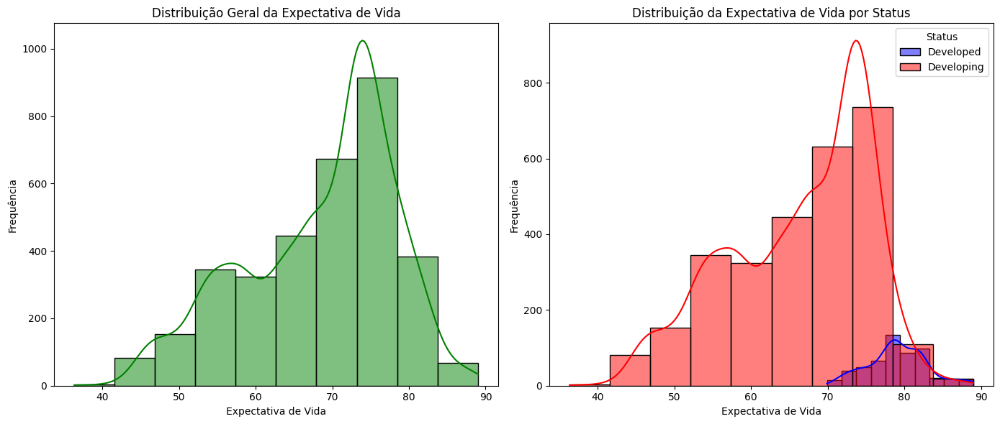

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

# Criar a figura e os subplots (1 linha, 2 colunas)
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Gráfico 1: Distribuição geral da expectativa de vida
sns.histplot(df_filtrado['expectativa_vida'], kde=True, bins=10, color='green', ax=axes[0])
axes[0].set_title('Distribuição Geral da Expectativa de Vida')
axes[0].set_xlabel('Expectativa de Vida')
axes[0].set_ylabel('Frequência')

# Gráfico 2: Distribuição da expectativa de vida por status (Developed vs Developing)
sns.histplot(df_filtrado[df_filtrado['status'] == 'Developed']['expectativa_vida'], 
             kde=True, bins=10, color='blue', label='Developed', ax=axes[1])
sns.histplot(df_filtrado[df_filtrado['status'] == 'Developing']['expectativa_vida'], 
             kde=True, bins=10, color='red', label='Developing', ax=axes[1])

# Configurações do segundo gráfico
axes[1].set_title('Distribuição da Expectativa de Vida por Status')
axes[1].set_xlabel('Expectativa de Vida')
axes[1].set_ylabel('Frequência')
axes[1].legend(title='Status')

# Ajustar layout
plt.tight_layout()

# Exibir o gráfico
plt.show()


In [18]:
print(f'\nPaíses em desenvolvimento \nVariância do nosso target: {df_filtrado[df_filtrado['status'] == 'Developing']['expectativa_vida'].var()} \nMédia do nosso target: {df_filtrado[df_filtrado['status'] == 'Developing']['expectativa_vida'].mean()} \nDesvio Padrão do nosso target: {df_filtrado[df_filtrado['status'] == 'Developing']['expectativa_vida'].std()}')

print(f'\nPaíses desenvolvidos \nVariância do nosso target: {df_filtrado[df_filtrado['status'] == 'Developed']['expectativa_vida'].var()} \nMédia do nosso target: {df_filtrado[df_filtrado['status'] == 'Developed']['expectativa_vida'].mean()} \nDesvio Padrão do nosso target: {df_filtrado[df_filtrado['status'] == 'Developed']['expectativa_vida'].std()}')



Países em desenvolvimento 
Variância do nosso target: 85.49598102477277 
Média do nosso target: 66.4491573033708 
Desvio Padrão do nosso target: 9.246403680608628

Países desenvolvidos 
Variância do nosso target: 14.65146405454447 
Média do nosso target: 79.1310661764706 
Desvio Padrão do nosso target: 3.8277230901078085


___
## Imputando a variável continente
___

In [19]:
# import pandas as pd
# import pycountry_convert as pc

# def country_to_continent(country_name):
#     try:
#         # Converte o nome do país em código alpha-2
#         country_alpha2 = pc.country_name_to_country_alpha2(country_name)
#         # Obtém o código do continente
#         country_continent_code = pc.country_alpha2_to_continent_code(country_alpha2)
#         # Converte o código do continente em nome
#         country_continent_name = pc.convert_continent_code_to_continent_name(country_continent_code)
#         return country_continent_name
#     except Exception as e:
#         return None  # Retorna None se o país não for encontrado

# # Adicionando a coluna "continente"
# df_filtrado['continente'] = df_filtrado['pais'].apply(country_to_continent)

# # Exibindo o DataFrame resultante
# df_filtrado


In [20]:
print('Porcentagem de nulos para cada variável:','\n',(df_filtrado.isnull().sum()/df_filtrado.shape[0])*100)

Porcentagem de nulos para cada variável: 
 pais                           0.000000
ano                            0.000000
status                         0.000000
expectativa_vida               0.000000
mortalidade_adulta             0.000000
mortes_infanis                 0.000000
consumo_alcool                 6.544811
pct_despesa_saude_pib          0.000000
vacina_hep_b_crianca          17.806604
relato_sarampo                 0.000000
IMC                            0.943396
mortalidade_5anos              0.000000
vacina_poliomelite_crianca     0.560142
pct_despesa_saude              7.517689
vacina_difteria_crianca        0.560142
morte_HIV_4anos                0.000000
PIB                           16.126179
populacao                      2.358491
magreza_10_19                  0.943396
magreza_5_9                    0.943396
composicao_recursos_renda      5.660377
escolaridade                   5.660377
dtype: float64



# Imputando a média nas variáveis de cada país


___
## vacina_poliomelite_crianca
___

In [21]:
# 1. Criar uma função para imputar a média nos valores ausentes
def imputar_media(row, coluna, media):
    if pd.isnull(row[coluna]):
        return media[row['pais']]
    else:
        return row[coluna]

In [22]:
vacina_poliomelite_crianca_na = df_filtrado[df_filtrado['vacina_poliomelite_crianca'].isna()]
vacina_poliomelite_crianca_na.pais.value_counts()

pais
South Sudan    11
Montenegro      6
Timor-Leste     2
Name: count, dtype: int64

In [23]:
# 2. Calcular a média de consumo de álcool por país, ignorando os valores ausentes
media_vacina_poliomelite_crianca = df_filtrado.groupby('pais')['vacina_poliomelite_crianca'].mean()

df_filtrado2 = df_filtrado.copy()

df_filtrado2['vacina_poliomelite_crianca'] = df_filtrado2.apply(imputar_media, axis=1, args=('vacina_poliomelite_crianca', media_vacina_poliomelite_crianca,))
vacina_poliomelite_crianca_na = df_filtrado2[df_filtrado2['vacina_poliomelite_crianca'].isna()]
vacina_poliomelite_crianca_na.pais.value_counts()

Series([], Name: count, dtype: int64)

___
## vacina_hep_b_crianca          
___

In [24]:
vacina_hep_b_crianca_na = df_filtrado[df_filtrado['vacina_hep_b_crianca'].isna()]
vacina_hep_b_crianca_na.pais.value_counts()

pais
Central African Republic                                45
Denmark                                                 16
Finland                                                 16
Slovenia                                                16
United Kingdom Of Great Britain And Northern Ireland    16
                                                        ..
Guyana                                                   1
Mozambique                                               1
Grenada                                                  1
Panama                                                   1
Russian Federation                                       1
Name: count, Length: 98, dtype: int64

In [25]:
media_vacina_hep_b_crianca = df_filtrado2.groupby('pais')['vacina_hep_b_crianca'].mean()

df_filtrado3 = df_filtrado2.copy()

df_filtrado3['vacina_hep_b_crianca'] = df_filtrado3.apply(imputar_media, axis=1, args=('vacina_hep_b_crianca', media_vacina_hep_b_crianca,))
vacina_hep_b_crianca_na = df_filtrado3[df_filtrado3['vacina_hep_b_crianca'].isna()]
vacina_hep_b_crianca_na.pais.value_counts()

pais
Denmark                                                 16
Finland                                                 16
Hungary                                                 16
Iceland                                                 16
Japan                                                   16
Norway                                                  16
Slovenia                                                16
Switzerland                                             16
United Kingdom Of Great Britain And Northern Ireland    16
Name: count, dtype: int64

___
## consumo_alcool
___

In [26]:
consumo_alcool_na = df_filtrado[df_filtrado['consumo_alcool'].isna()]
consumo_alcool_na.pais.value_counts()

pais
South Sudan                           16
South Africa                          11
Central African Republic               5
China                                  3
Antigua And Barbuda                    3
                                      ..
Venezuela (Bolivarian Republic Of)     1
Viet Nam                               1
Yemen                                  1
Zambia                                 1
Zimbabwe                               1
Name: count, Length: 177, dtype: int64

In [27]:
media_consumo_alcool = df_filtrado2.groupby('pais')['consumo_alcool'].mean()

df_filtrado4 = df_filtrado3.copy()

df_filtrado4['consumo_alcool'] = df_filtrado4.apply(imputar_media, axis=1, args=('consumo_alcool', media_consumo_alcool,))
consumo_alcool_na = df_filtrado4[df_filtrado4['consumo_alcool'].isna()]
consumo_alcool_na.pais.value_counts()

pais
South Sudan    16
Name: count, dtype: int64

___
## pct_despesa_saude
___

In [28]:
pct_despesa_saude_na = df_filtrado[df_filtrado['pct_despesa_saude'].isna()]
pct_despesa_saude_na.pais.value_counts()

pais
Democratic People'S Republic Of Korea    16
Somalia                                  16
South Sudan                              13
South Africa                             11
Central African Republic                  5
                                         ..
Venezuela (Bolivarian Republic Of)        1
Viet Nam                                  1
Yemen                                     1
Zambia                                    1
Zimbabwe                                  1
Name: count, Length: 181, dtype: int64

In [29]:
media_pct_despesa_saude = df_filtrado2.groupby('pais')['pct_despesa_saude'].mean()

df_filtrado5 = df_filtrado4.copy()

df_filtrado5['pct_despesa_saude'] = df_filtrado5.apply(imputar_media, axis=1, args=('pct_despesa_saude', media_pct_despesa_saude,))
pct_despesa_saude_na = df_filtrado5[df_filtrado5['pct_despesa_saude'].isna()]
pct_despesa_saude_na.pais.value_counts()

pais
Democratic People'S Republic Of Korea    16
Somalia                                  16
Name: count, dtype: int64

___
## magreza_5_9
___

In [30]:
magreza_5_9_na = df_filtrado[df_filtrado['magreza_5_9'].isna()]
magreza_5_9_na.pais.value_counts()

pais
South Sudan    16
Sudan          16
Name: count, dtype: int64

___
## vacina_difteria_crianca
___

In [31]:
vacina_difteria_crianca_na = df_filtrado[df_filtrado['vacina_difteria_crianca'].isna()]
vacina_difteria_crianca_na.pais.value_counts()

pais
South Sudan    11
Montenegro      6
Timor-Leste     2
Name: count, dtype: int64

In [32]:
media_vacina_difteria_crianca = df_filtrado2.groupby('pais')['vacina_difteria_crianca'].mean()

df_filtrado6 = df_filtrado5.copy()

df_filtrado6['vacina_difteria_crianca'] = df_filtrado6.apply(imputar_media, axis=1, args=('vacina_difteria_crianca', media_vacina_difteria_crianca,))
vacina_difteria_crianca_na = df_filtrado6[df_filtrado6['vacina_difteria_crianca'].isna()]
vacina_difteria_crianca_na.pais.value_counts()

Series([], Name: count, dtype: int64)

In [33]:
print(f'Porcentagem de nulos para cada variável:\n{(df_filtrado6.isnull().sum()/df_filtrado6.shape[0])*100}')

Porcentagem de nulos para cada variável:
pais                           0.000000
ano                            0.000000
status                         0.000000
expectativa_vida               0.000000
mortalidade_adulta             0.000000
mortes_infanis                 0.000000
consumo_alcool                 0.471698
pct_despesa_saude_pib          0.000000
vacina_hep_b_crianca           4.245283
relato_sarampo                 0.000000
IMC                            0.943396
mortalidade_5anos              0.000000
vacina_poliomelite_crianca     0.000000
pct_despesa_saude              0.943396
vacina_difteria_crianca        0.000000
morte_HIV_4anos                0.000000
PIB                           16.126179
populacao                      2.358491
magreza_10_19                  0.943396
magreza_5_9                    0.943396
composicao_recursos_renda      5.660377
escolaridade                   5.660377
dtype: float64


In [34]:
df_filtrado6.drop_duplicates(subset=['pais', 'ano'], keep='first', inplace=True)
df_filtrado6.pais.value_counts()

pais
Afghanistan                           16
Albania                               16
Algeria                               16
Angola                                16
Antigua And Barbuda                   16
                                      ..
Venezuela (Bolivarian Republic Of)    16
Viet Nam                              16
Yemen                                 16
Zambia                                16
Zimbabwe                              16
Name: count, Length: 183, dtype: int64

In [35]:
escolaridade_na = df_filtrado6[df_filtrado6['composicao_recursos_renda'].isna()]
escolaridade_na.pais.value_counts()

pais
Côte D'Ivoire                                           16
Czechia                                                 16
Democratic People'S Republic Of Korea                   16
Democratic Republic Of The Congo                        16
Republic Of Korea                                       16
Republic Of Moldova                                     16
Somalia                                                 16
United Kingdom Of Great Britain And Northern Ireland    16
United Republic Of Tanzania                             16
United States Of America                                16
Name: count, dtype: int64

In [36]:
df_filtrado6.drop_duplicates(subset=['pais', 'ano'], keep='first', inplace=True)
df_filtrado6.pais.value_counts()

pais
Afghanistan                           16
Albania                               16
Algeria                               16
Angola                                16
Antigua And Barbuda                   16
                                      ..
Venezuela (Bolivarian Republic Of)    16
Viet Nam                              16
Yemen                                 16
Zambia                                16
Zimbabwe                              16
Name: count, Length: 183, dtype: int64

In [37]:
df_filtrado6.dropna(how='any', inplace=True)

In [38]:
df_filtrado6.shape

(2330, 22)

In [39]:
print(f'Porcentagem de nulos para cada variável:\n{(df_filtrado6.isnull().sum()/df_filtrado6.shape[0])*100}')

Porcentagem de nulos para cada variável:
pais                          0.0
ano                           0.0
status                        0.0
expectativa_vida              0.0
mortalidade_adulta            0.0
mortes_infanis                0.0
consumo_alcool                0.0
pct_despesa_saude_pib         0.0
vacina_hep_b_crianca          0.0
relato_sarampo                0.0
IMC                           0.0
mortalidade_5anos             0.0
vacina_poliomelite_crianca    0.0
pct_despesa_saude             0.0
vacina_difteria_crianca       0.0
morte_HIV_4anos               0.0
PIB                           0.0
populacao                     0.0
magreza_10_19                 0.0
magreza_5_9                   0.0
composicao_recursos_renda     0.0
escolaridade                  0.0
dtype: float64


In [40]:
df_filtrado6.to_csv('df_filtrado.csv', index=False)

# Tratando dados que talvez não condizam com a realidade daquele país

___
## relato_sarampo
___

In [40]:
import pandas as pd

# Função para identificar outliers por país
def identificar_outliers(group, variavel):
    # Calcula os quartis para o grupo (país)
    Q1 = group[variavel].quantile(0.25)
    Q3 = group[variavel].quantile(0.75)
    IQR = Q3 - Q1
    
    # Definir limites para outliers
    limite_inferior = Q1 - 1.5 * IQR
    limite_superior = Q3 + 3.5 * IQR
    
    # Identificar valores abaixo de Q1 - 1.5 * IQR ou acima de Q3 + 1.5 * IQR
    outliers_inferiores = group[group[variavel] < limite_inferior]
    outliers_superiores = group[group[variavel] > limite_superior]
    
    # Retorna um dataframe com os outliers encontrados
    return pd.concat([outliers_inferiores, outliers_superiores])

# Aplicar a função em cada grupo de país
outliers_por_pais = df_filtrado6.groupby('pais').apply(identificar_outliers, 'relato_sarampo')

outliers_por_pais.reset_index(drop=True, inplace=True)
outliers_por_pais.pais.value_counts()
outliers_por_pais.pais.value_counts()


pais
Bosnia And Herzegovina    3
Bulgaria                  3
Costa Rica                3
Botswana                  3
Peru                      3
                         ..
Sri Lanka                 1
Tunisia                   1
Tonga                     1
Togo                      1
Zimbabwe                  1
Name: count, Length: 93, dtype: int64

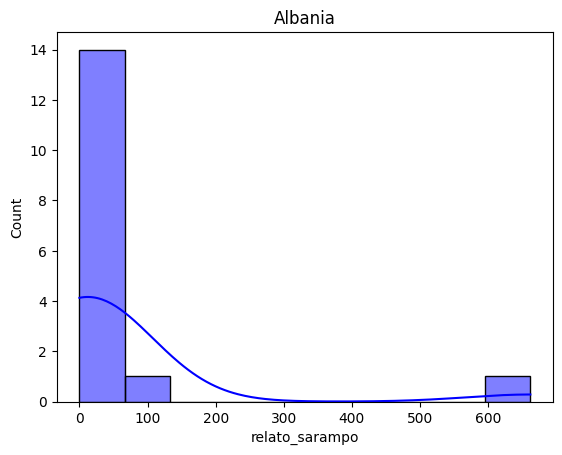

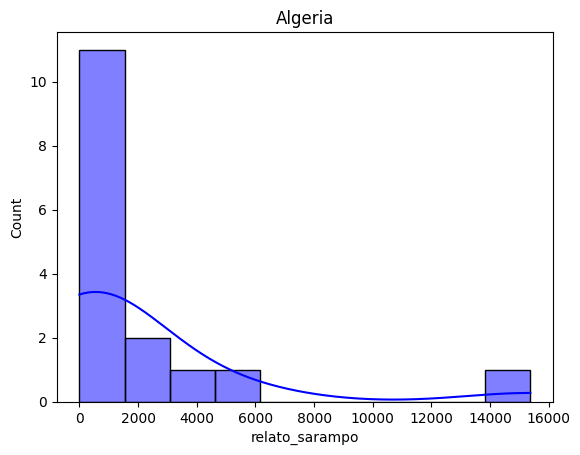

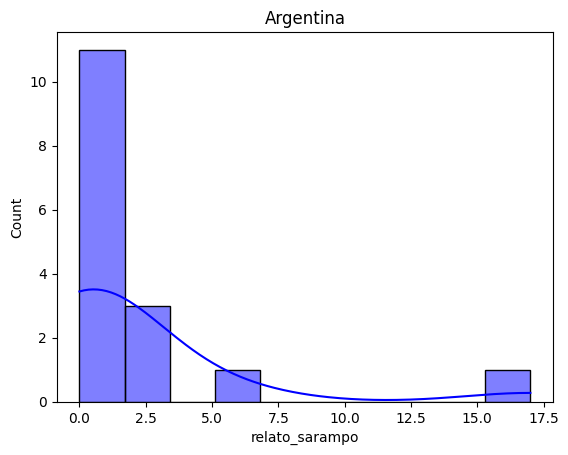

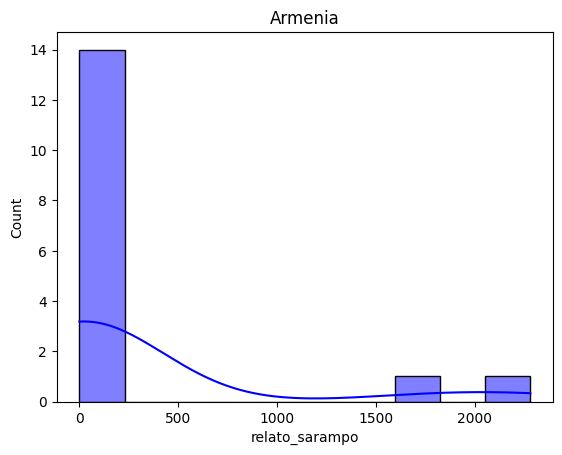

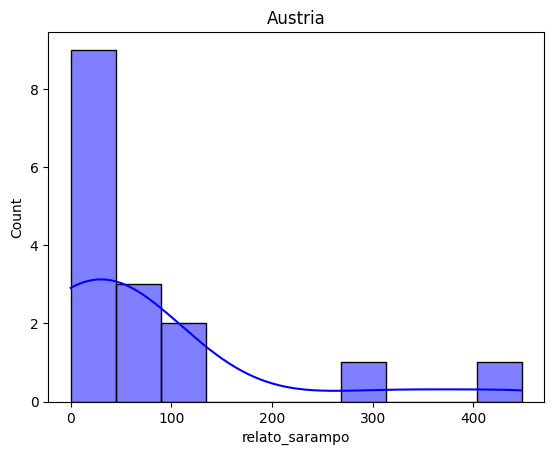

...

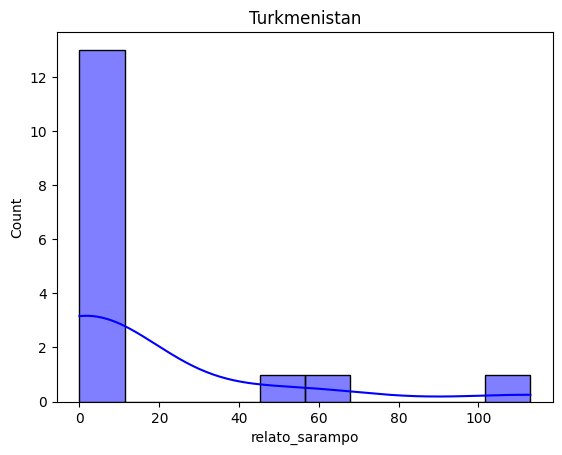

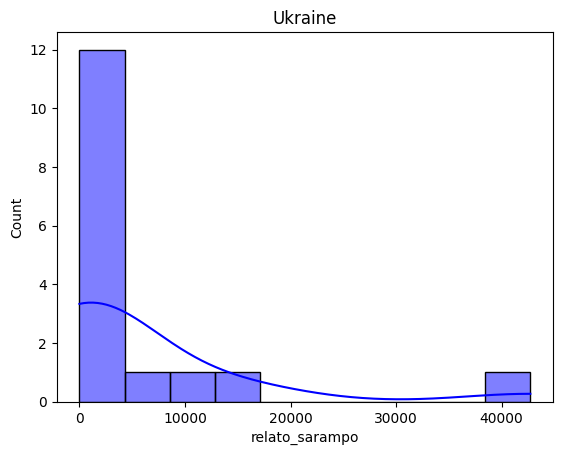

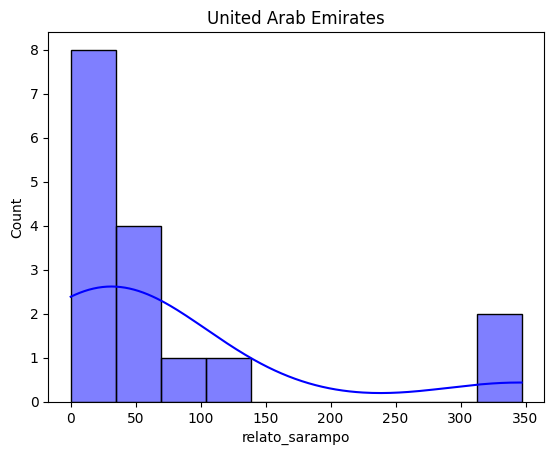

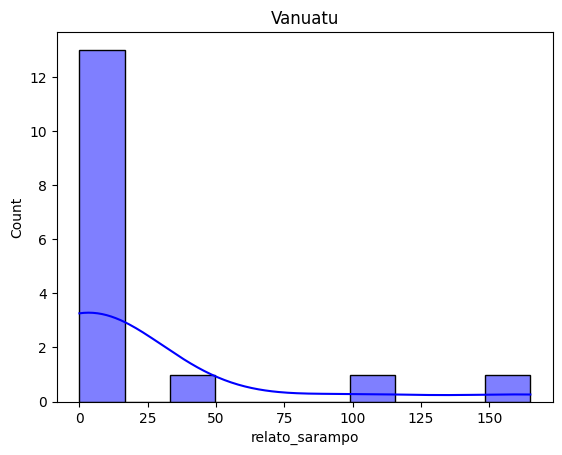

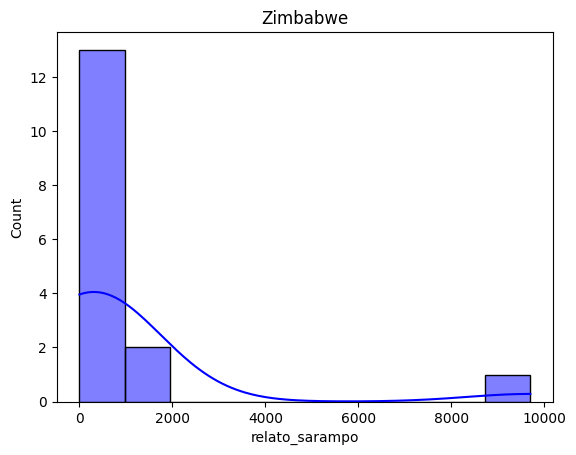

In [41]:
for pais in outliers_por_pais.pais.unique():
    sns.histplot(data=df_filtrado6[df_filtrado6['pais'] == pais], x='relato_sarampo', kde=True, bins=10, color='blue')
    plt.title(f'{pais}')
    plt.show()

In [42]:
import pandas as pd

# Função para identificar e substituir outliers por mediana por país
def substituir_outliers_por_mediana(group, variavel):
    # Calcula os quartis e a mediana para o grupo (país)
    Q1 = group[variavel].quantile(0.25)
    Q3 = group[variavel].quantile(0.75)
    IQR = Q3 - Q1
    mediana_pais = group[variavel].median()  # Mediana do país

    # Definir limites para outliers
    limite_inferior = Q1 - 1.5 * IQR
    limite_superior = Q3 + 1.5 * IQR
    
    # Substituir valores abaixo de Q1 - 1.5 * IQR ou acima de Q3 + 1.5 * IQR pela mediana
    group.loc[group[variavel] < limite_inferior, variavel] = mediana_pais
    group.loc[group[variavel] > limite_superior, variavel] = mediana_pais
    
    return group

# quero que aplique menos nesses paises Chile, Costa Rica, El Salvador, Jamaica, Panama, Peru
paises_mask = ['Chile', 'Costa Rica', 'El Salvador', 'Jamaica', 'Panama', 'Peru']
df_paises_outliers = df_filtrado6[~df_filtrado6['pais'].isin(paises_mask)].copy()


df_cleaned = df_paises_outliers.groupby('pais').apply(substituir_outliers_por_mediana, 'relato_sarampo')
df_cleaned.reset_index(drop=True, inplace=True)

# Agora voltar com os dados dos outros países
df_cleaned = pd.concat([df_cleaned, df_filtrado6[df_filtrado6['pais'].isin(paises_mask)]])

In [43]:
df_cleaned[df_cleaned["pais"] == "Armenia"]

,pais,ano,status,expectativa_vida,mortalidade_adulta,mortes_infanis,consumo_alcool,pct_despesa_saude_pib,vacina_hep_b_crianca,relato_sarampo,IMC,mortalidade_5anos,vacina_poliomelite_crianca,pct_despesa_saude,vacina_difteria_crianca,morte_HIV_4anos,PIB,populacao,magreza_10_19,magreza_5_9,composicao_recursos_renda,escolaridade
96,Armenia,2015,Developing,74.8,118.0,1,3.702667,0.000000,94.0,33.0,54.9,1,96.0,4.861333,94.0,0.1,369.654776,2878595.0,2.1,2.2,0.741,12.7
97,Armenia,2014,Developing,74.6,12.0,1,3.910000,295.608714,93.0,13.0,54.1,1,95.0,4.480000,93.0,0.1,3994.712355,2889930.0,2.1,2.1,0.739,12.7
98,Armenia,2013,Developing,74.4,123.0,1,3.790000,279.429081,95.0,10.0,53.3,1,96.0,4.550000,95.0,0.1,3843.591213,2901385.0,2.1,2.1,0.736,12.7
99,Armenia,2012,Developing,74.4,121.0,1,3.890000,274.152699,95.0,0.0,52.6,1,96.0,4.480000,95.0,0.1,3684.848100,2914421.0,2.0,2.1,0.732,12.7
100,Armenia,2011,Developing,73.9,128.0,1,4.090000,260.996383,95.0,0.0,51.9,1,96.0,3.710000,95.0,0.1,3526.978143,2928976.0,2.0,2.1,0.729,12.7
101,Armenia,2010,Developing,73.5,132.0,1,4.230000,224.321201,94.0,2.0,51.2,1,96.0,4.560000,94.0,0.1,3218.381655,2946293.0,2.0,2.1,0.720,12.3
102,Armenia,2009,Developing,73.3,137.0,1,3.960000,201.185546,93.0,0.0,5.7,1,94.0,4.550000,93.0,0.1,2993.832531,2964296.0,2.0,2.1,0.725,11.9
103,Armenia,2008,Developing,73.2,14.0,1,3.960000,2.888898,89.0,0.0,5.1,1,91.0,3.800000,89.0,0.1,41.269970,2983421.0,2.0,2.1,0.721,12.3
104,Armenia,2007,Developing,73.5,132.0,1,3.990000,44.572200,85.0,1.0,49.7,1,9.0,4.310000,88.0,0.1,3138.887300,3004393.0,2.0,2.1,0.707,11.7
105,Armenia,2006,Developing,72.9,141.0,1,4.010000,244.535277,78.0,11.5,49.2,1,87.0,4.580000,87.0,0.1,2158.299000,3026486.0,2.0,2.1,0.692,11.2


___
## mortalidade_adulta
___

In [44]:
# Aplicar a função em cada grupo de país
outliers_mortalidade_adulta = df_filtrado6.groupby('pais').apply(identificar_outliers, 'mortalidade_adulta')

outliers_mortalidade_adulta.reset_index(drop=True, inplace=True)
outliers_mortalidade_adulta.pais.value_counts()
outliers_mortalidade_adulta.pais.value_counts()

pais
Colombia             6
Cameroon             4
Brunei Darussalam    4
China                4
El Salvador          4
                    ..
Sri Lanka            1
South Africa         1
Thailand             1
Sweden               1
Turkmenistan         1
Name: count, Length: 96, dtype: int64

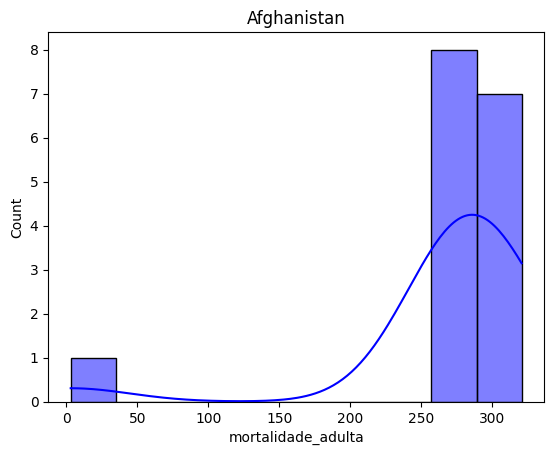

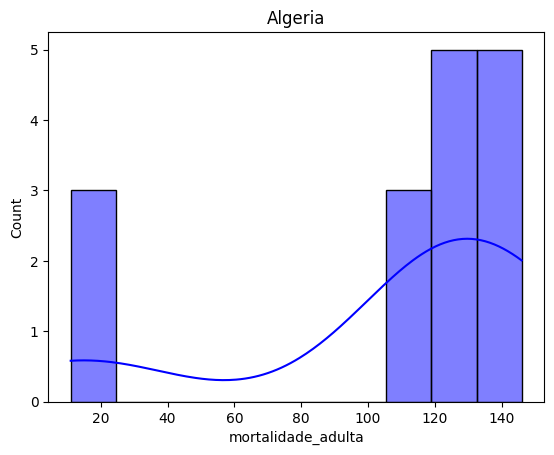

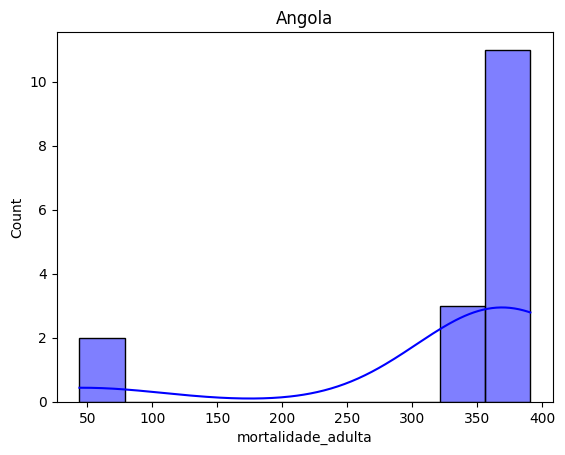

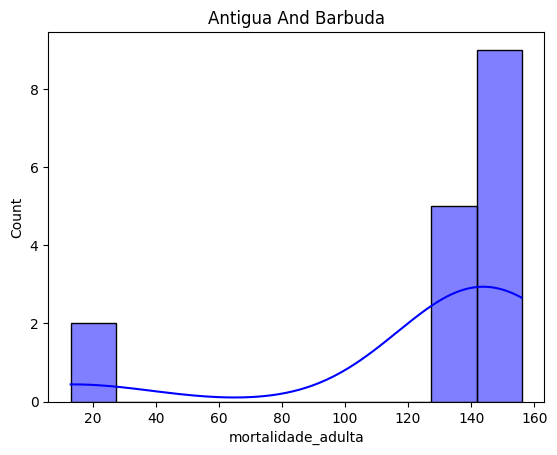

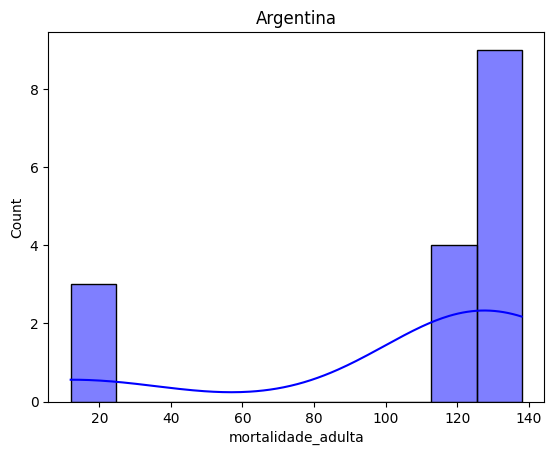

...

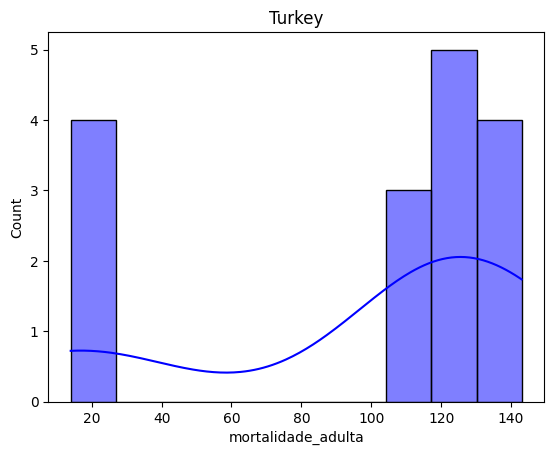

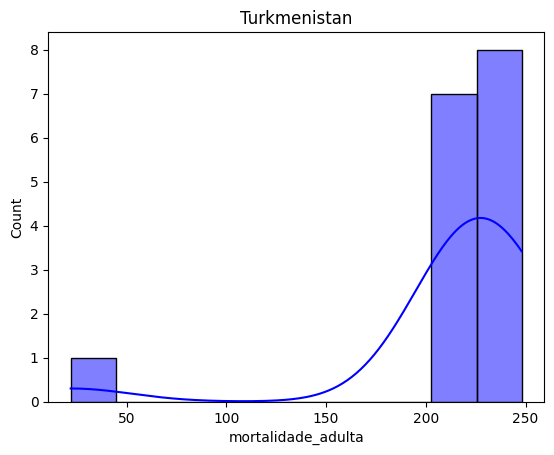

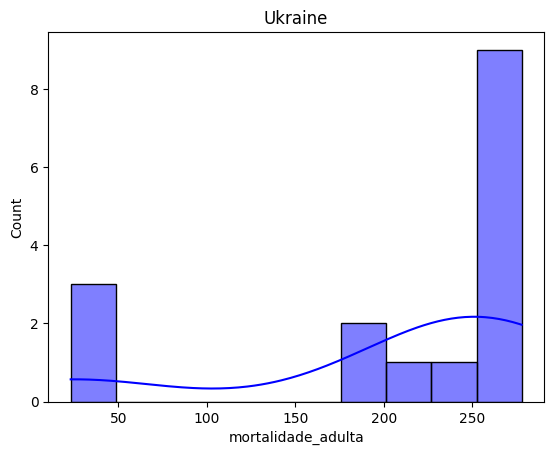

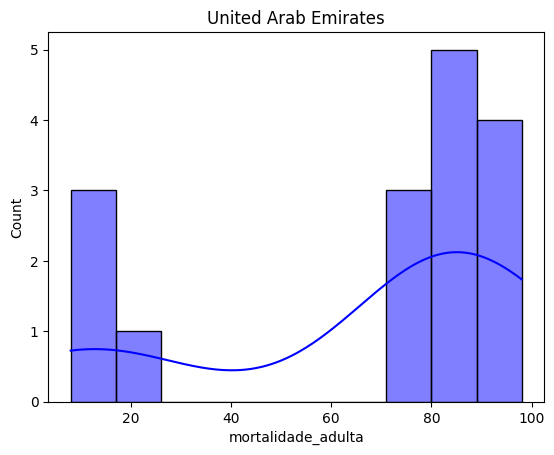

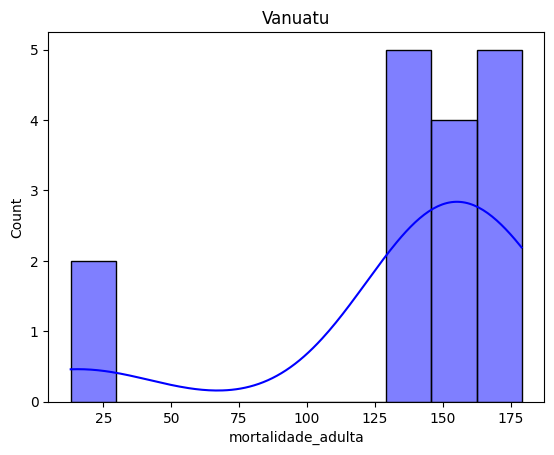

In [45]:
for pais in outliers_mortalidade_adulta.pais.unique():
    sns.histplot(data=df_filtrado6[df_filtrado6['pais'] == pais], x='mortalidade_adulta', kde=True, bins=10, color='blue')
    plt.title(f'{pais}')
    plt.show()

In [46]:
df_cleaned2 = df_cleaned.groupby('pais').apply(substituir_outliers_por_mediana, 'mortalidade_adulta')
df_cleaned2.reset_index(drop=True, inplace=True)

In [47]:
df_cleaned2[df_cleaned2["pais"] == "Afghanistan"]

,pais,ano,status,expectativa_vida,mortalidade_adulta,mortes_infanis,consumo_alcool,pct_despesa_saude_pib,vacina_hep_b_crianca,relato_sarampo,IMC,mortalidade_5anos,vacina_poliomelite_crianca,pct_despesa_saude,vacina_difteria_crianca,morte_HIV_4anos,PIB,populacao,magreza_10_19,magreza_5_9,composicao_recursos_renda,escolaridade
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154.0,19.1,83,6.0,8.16,65.0,0.1,584.259210,33753499.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492.0,18.6,86,58.0,8.18,62.0,0.1,612.696514,32716210.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430.0,18.1,89,62.0,8.13,64.0,0.1,631.744976,31541209.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787.0,17.6,93,67.0,8.52,67.0,0.1,669.959000,30466479.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013.0,17.2,97,68.0,7.87,68.0,0.1,63.537231,29249157.0,18.2,18.2,0.454,9.5
5,Afghanistan,2010,Developing,58.8,279.0,74,0.01,79.679367,66.0,1989.0,16.7,102,66.0,9.20,66.0,0.1,553.328940,28189672.0,18.4,18.4,0.448,9.2
6,Afghanistan,2009,Developing,58.6,281.0,77,0.01,56.762217,63.0,2861.0,16.2,106,63.0,9.42,63.0,0.1,445.893298,27385307.0,18.6,18.7,0.434,8.9
7,Afghanistan,2008,Developing,58.1,287.0,80,0.03,25.873925,64.0,1599.0,15.7,110,64.0,8.33,64.0,0.1,373.361116,26427199.0,18.8,18.9,0.433,8.7
8,Afghanistan,2007,Developing,57.5,295.0,82,0.02,10.910156,63.0,1141.0,15.2,113,63.0,6.73,63.0,0.1,369.835796,25903301.0,19.0,19.1,0.415,8.4
9,Afghanistan,2006,Developing,57.3,295.0,84,0.03,17.171518,64.0,1990.0,14.7,116,58.0,7.43,58.0,0.1,272.563770,25442944.0,19.2,19.3,0.405,8.1


___
## mortes_infanis
___

In [48]:
# Aplicar a função em cada grupo de país
outliers_mortes_infanis = df_filtrado6.groupby('pais').apply(identificar_outliers, 'mortes_infanis')

outliers_mortes_infanis.reset_index(drop=True, inplace=True)
outliers_mortes_infanis.pais.value_counts()
outliers_mortes_infanis.pais.value_counts()

pais
Georgia       3
Greece        3
Mauritania    3
Ukraine       3
Portugal      3
Italy         2
Ghana         2
Panama        2
Namibia       2
Bulgaria      1
France        1
Israel        1
Kazakhstan    1
Pakistan      1
Paraguay      1
Name: count, dtype: int64

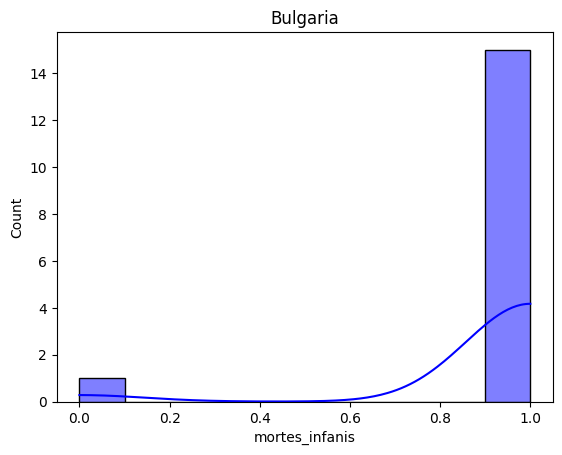

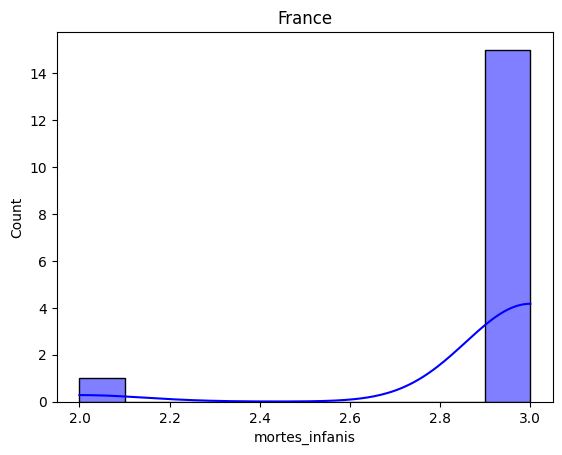

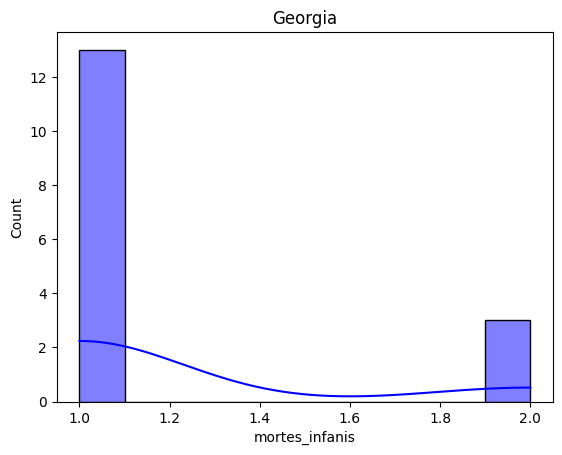

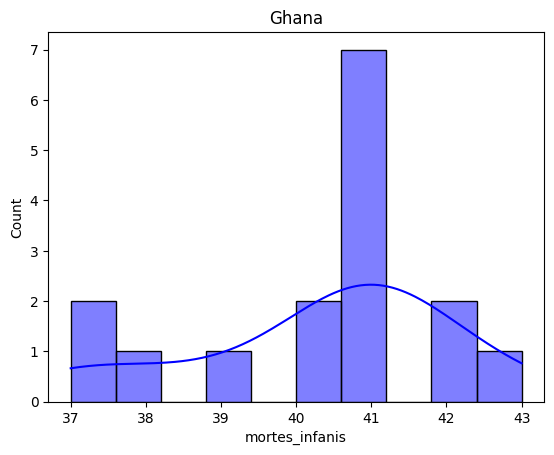

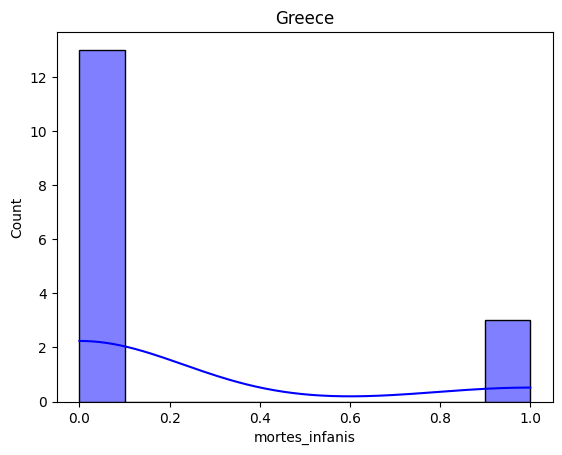

...

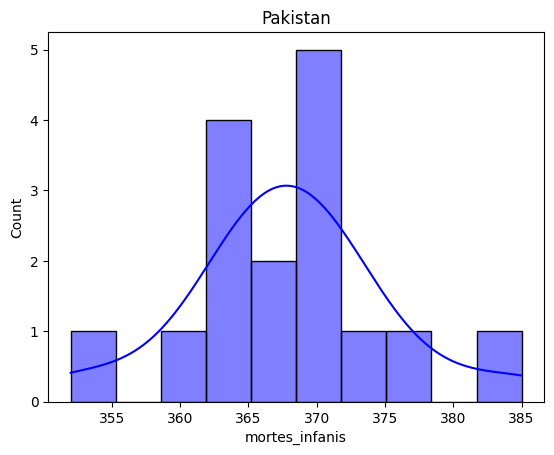

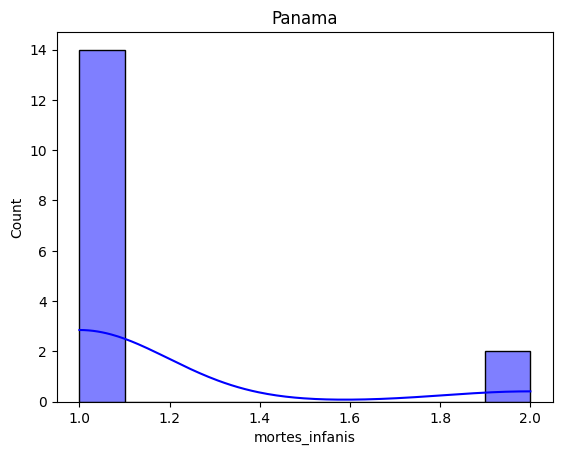

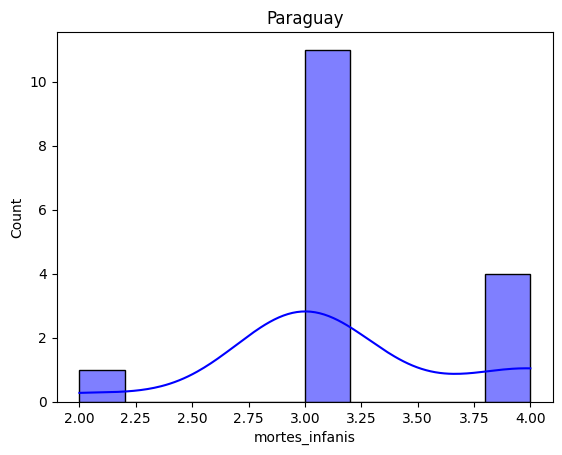

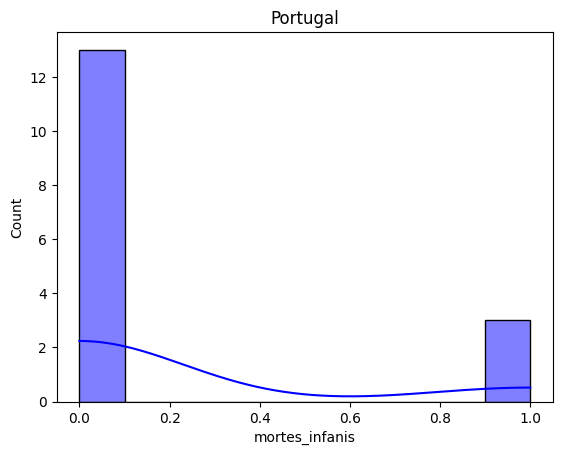

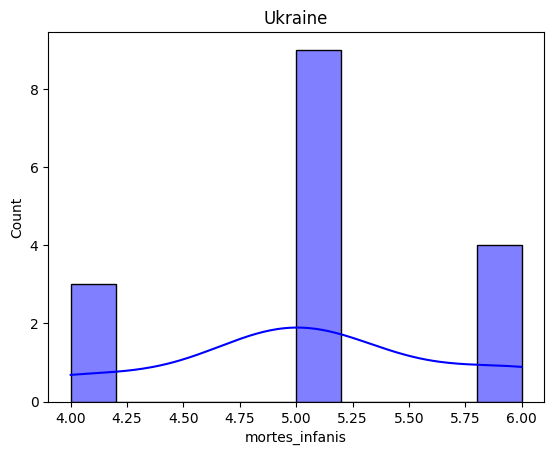

In [49]:
for pais in outliers_mortes_infanis.pais.unique():
    sns.histplot(data=df_filtrado6[df_filtrado6['pais'] == pais], x='mortes_infanis', kde=True, bins=10, color='blue')
    plt.title(f'{pais}')
    plt.show()

___
## consumo_alcool (depois analiso)
___

In [50]:
# Aplicar a função em cada grupo de país
outliers_consumo_alcool = df_filtrado6.groupby('pais').apply(identificar_outliers, 'consumo_alcool')

outliers_consumo_alcool.reset_index(drop=True, inplace=True)
outliers_consumo_alcool.pais.value_counts()
outliers_consumo_alcool.pais.value_counts()

pais
Tajikistan                  5
Central African Republic    4
Cabo Verde                  3
Belize                      3
Benin                       3
                           ..
Nigeria                     1
Myanmar                     1
Spain                       1
Trinidad And Tobago         1
Zambia                      1
Name: count, Length: 69, dtype: int64

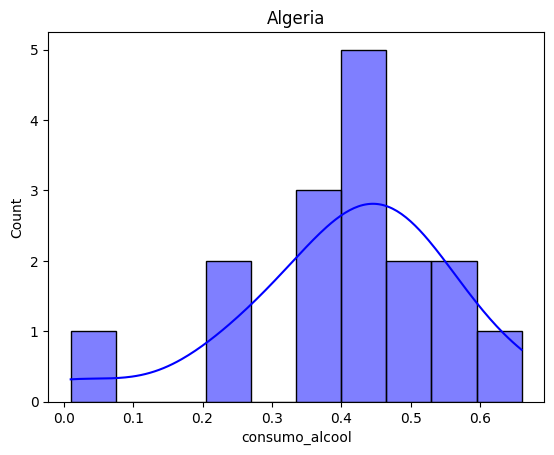

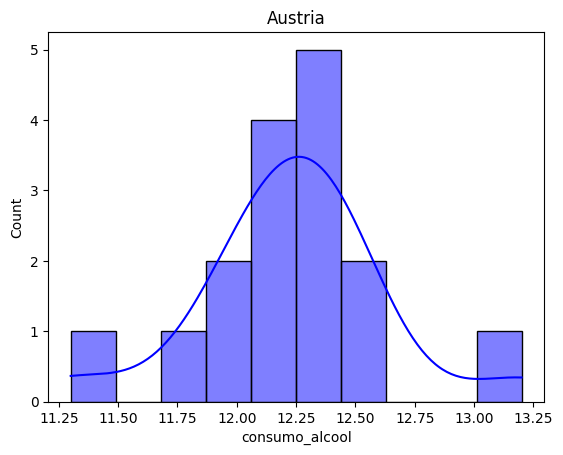

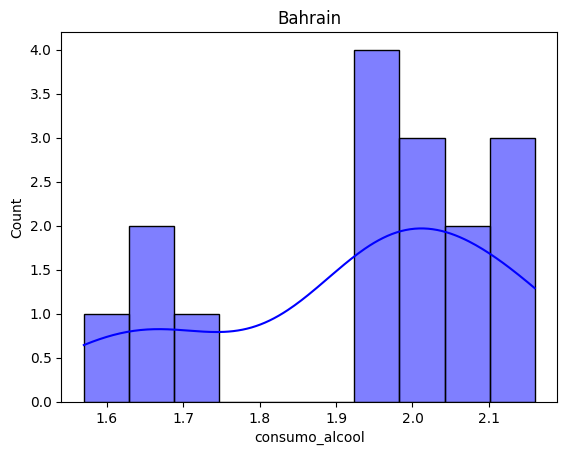

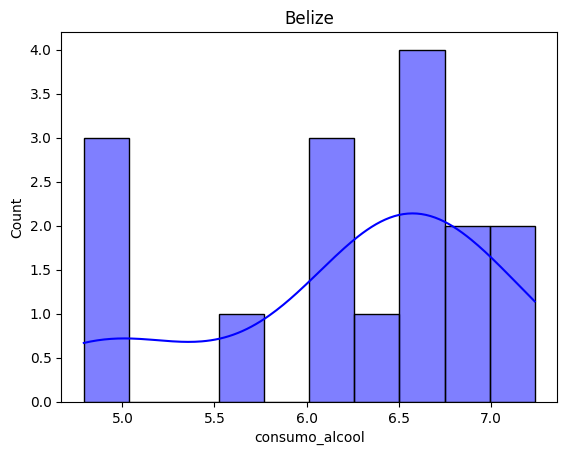

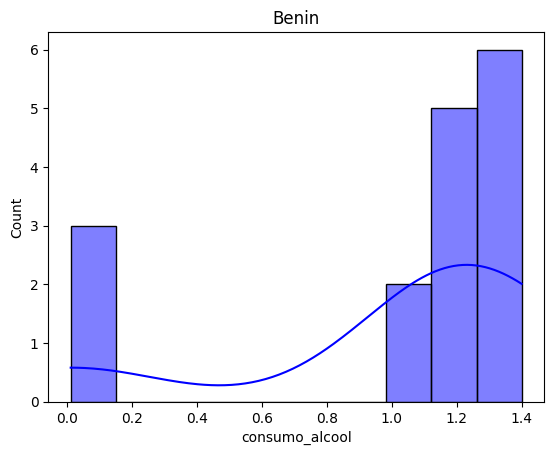

...

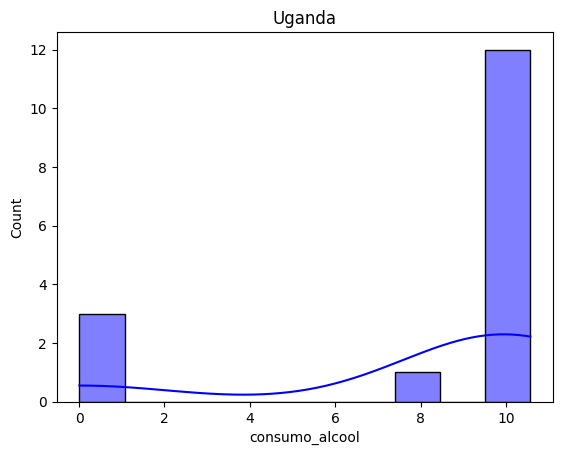

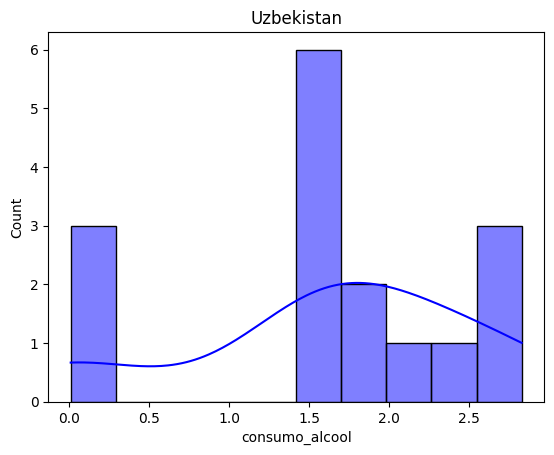

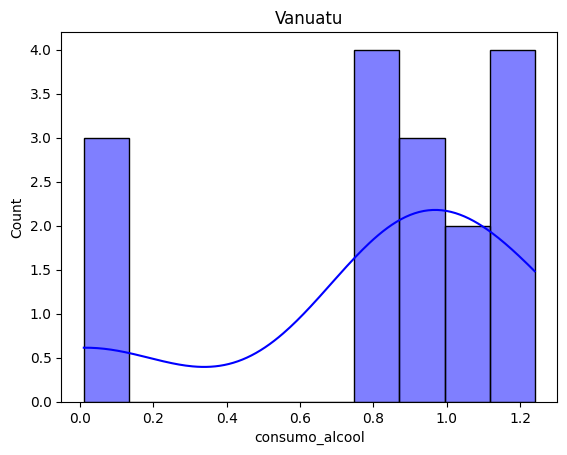

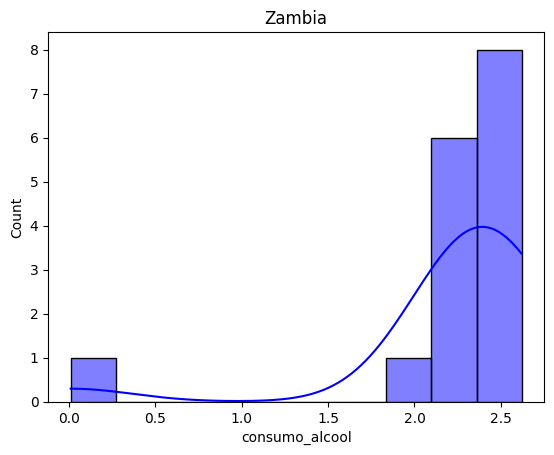

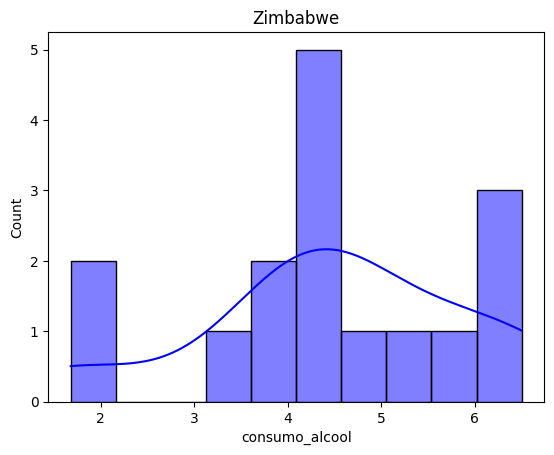

In [51]:
for pais in outliers_consumo_alcool.pais.unique():
    sns.histplot(data=df_filtrado6[df_filtrado6['pais'] == pais], x='consumo_alcool', kde=True, bins=10, color='blue')
    plt.title(f'{pais}')
    plt.show()

___
## pct_despesa_saude_pib
___

In [52]:
# Aplicar a função em cada grupo de país
outliers_pct_despesa_saude_pib = df_filtrado6.groupby('pais').apply(identificar_outliers, 'pct_despesa_saude_pib')

outliers_pct_despesa_saude_pib.reset_index(drop=True, inplace=True)
outliers_pct_despesa_saude_pib.pais.value_counts()
outliers_pct_despesa_saude_pib.pais.value_counts()

pais
Barbados                    3
Russian Federation          2
Central African Republic    1
Senegal                     1
Syrian Arab Republic        1
Turkey                      1
Name: count, dtype: int64

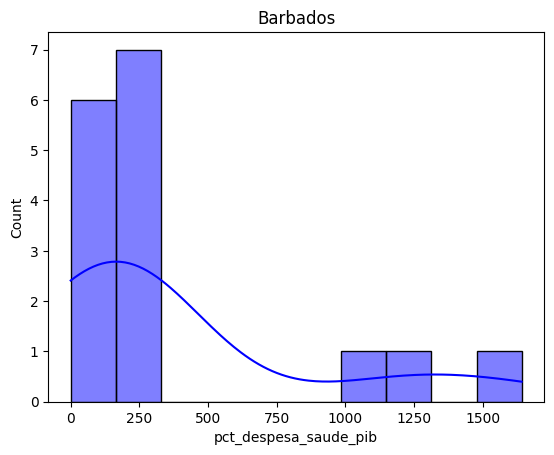

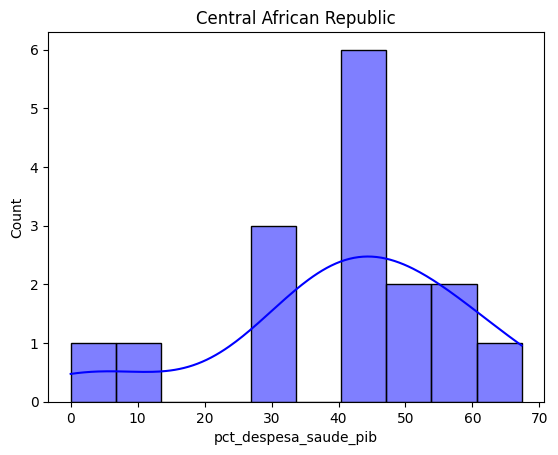

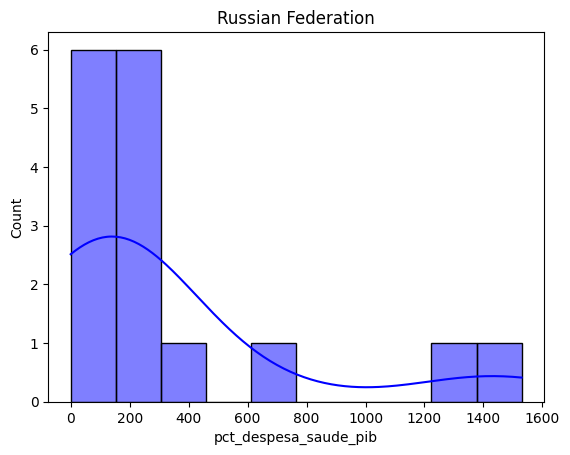

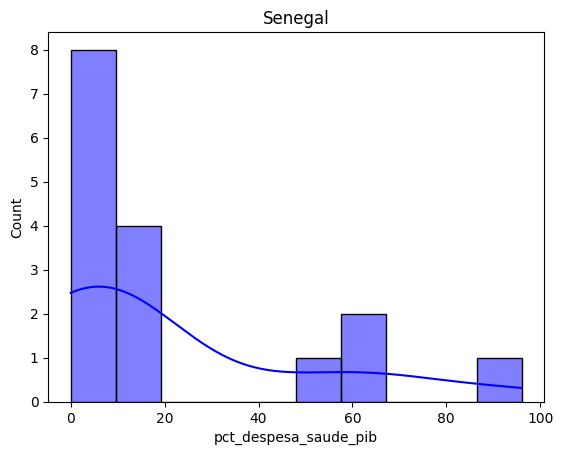

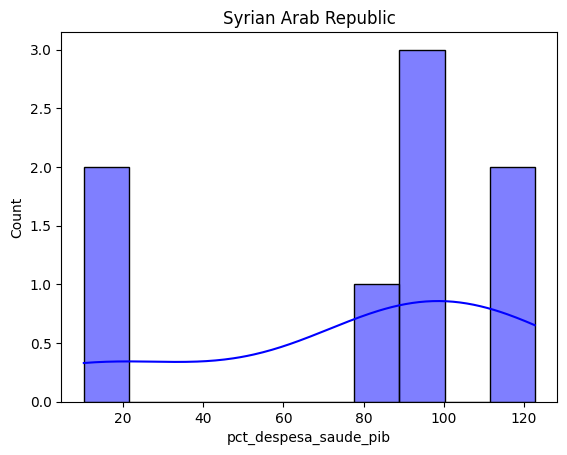

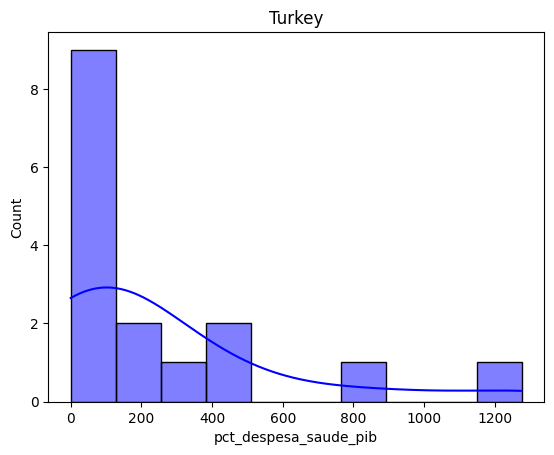

In [53]:
for pais in outliers_pct_despesa_saude_pib.pais.unique():
    sns.histplot(data=df_filtrado6[df_filtrado6['pais'] == pais], x='pct_despesa_saude_pib', kde=True, bins=10, color='blue')
    plt.title(f'{pais}')
    plt.show()

In [54]:
df_cleaned3 = df_cleaned2.groupby('pais').apply(substituir_outliers_por_mediana, 'pct_despesa_saude_pib')
df_cleaned3.reset_index(drop=True, inplace=True)

In [55]:
df_cleaned3

,pais,ano,status,expectativa_vida,mortalidade_adulta,mortes_infanis,consumo_alcool,pct_despesa_saude_pib,vacina_hep_b_crianca,relato_sarampo,IMC,mortalidade_5anos,vacina_poliomelite_crianca,pct_despesa_saude,vacina_difteria_crianca,morte_HIV_4anos,PIB,populacao,magreza_10_19,magreza_5_9,composicao_recursos_renda,escolaridade
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154.0,19.1,83,6.0,8.16,65.0,0.1,584.259210,33753499.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492.0,18.6,86,58.0,8.18,62.0,0.1,612.696514,32716210.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430.0,18.1,89,62.0,8.13,64.0,0.1,631.744976,31541209.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787.0,17.6,93,67.0,8.52,67.0,0.1,669.959000,30466479.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013.0,17.2,97,68.0,7.87,68.0,0.1,63.537231,29249157.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2325,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31.0,27.1,42,67.0,7.13,65.0,33.6,454.366654,12160881.0,9.4,9.4,0.407,9.2
2326,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998.0,26.7,41,7.0,6.52,68.0,36.7,453.351155,12075828.0,9.8,9.9,0.418,9.5
2327,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304.0,26.3,40,73.0,6.53,71.0,39.8,57.348340,11984644.0,1.2,1.3,0.427,10.0
2328,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529.0,25.9,39,76.0,6.16,75.0,42.1,548.587312,11910978.0,1.6,1.7,0.427,9.8


___
## vacina_hep_b_crianca
___

In [56]:
# Aplicar a função em cada grupo de país
outliers_vacina_hep_b_crianca = df_filtrado6.groupby('pais').apply(identificar_outliers, 'vacina_hep_b_crianca')

outliers_vacina_hep_b_crianca.reset_index(drop=True, inplace=True)
outliers_vacina_hep_b_crianca.pais.value_counts()
outliers_vacina_hep_b_crianca.pais.value_counts()

pais
Namibia        6
Timor-Leste    6
Sweden         5
Netherlands    5
Ethiopia       5
              ..
Romania        1
Pakistan       1
Senegal        1
Paraguay       1
Togo           1
Name: count, Length: 113, dtype: int64

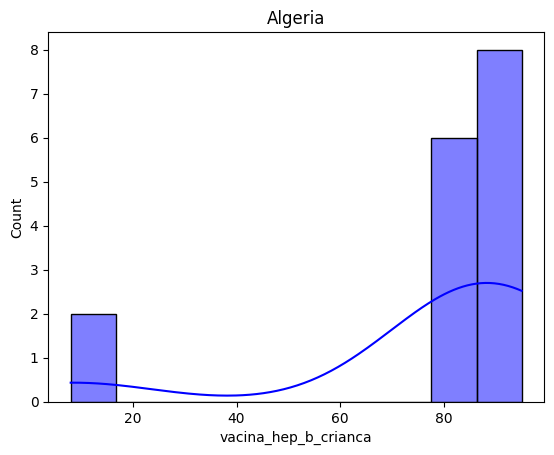

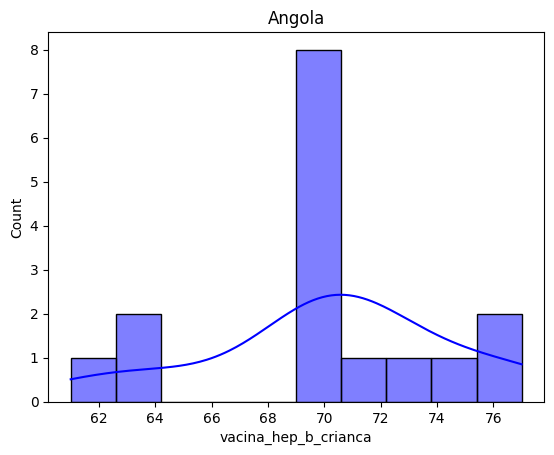

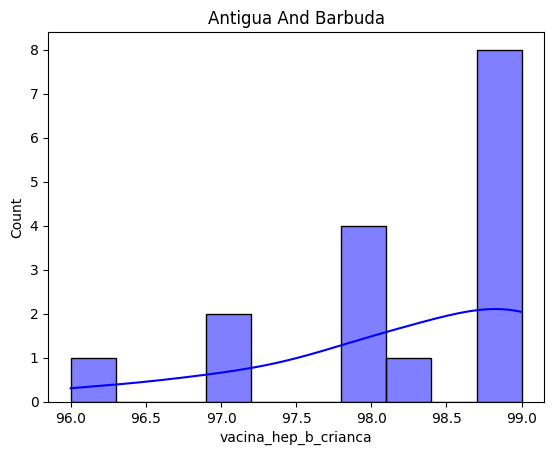

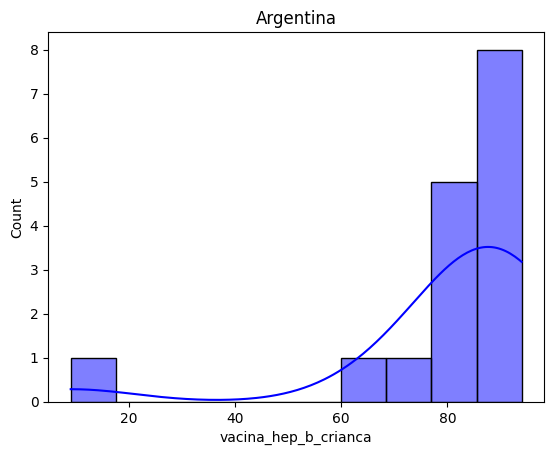

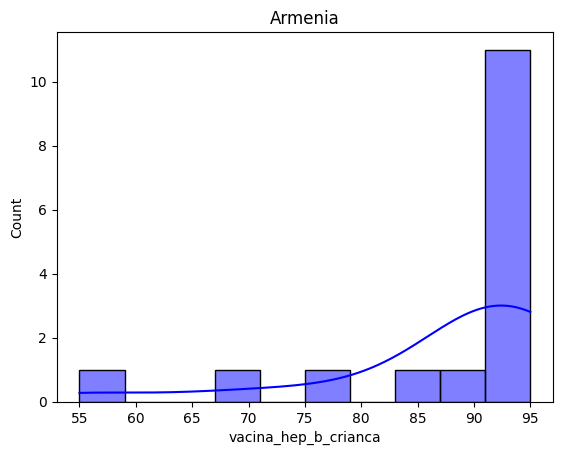

...

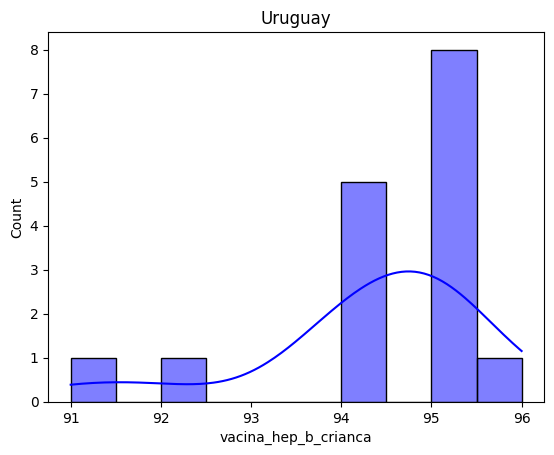

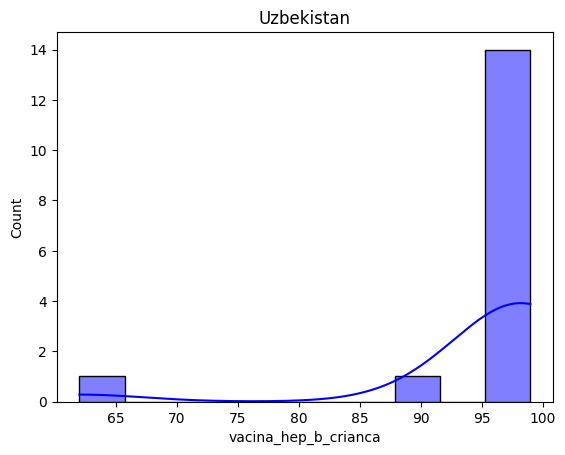

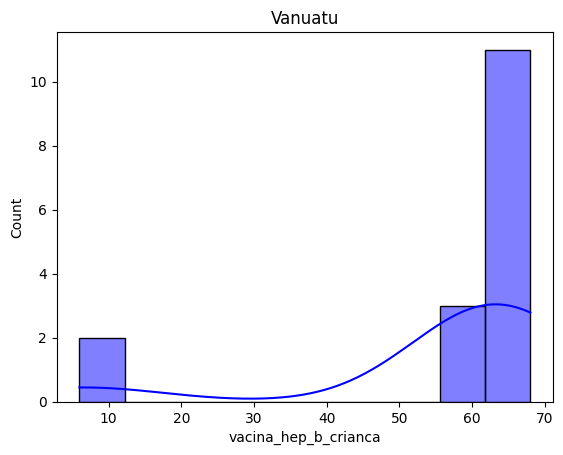

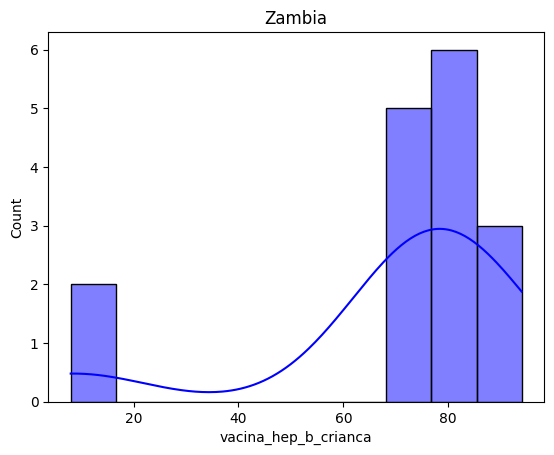

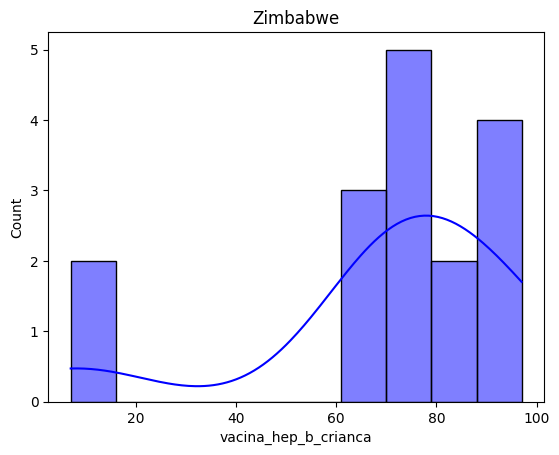

In [57]:
for pais in outliers_vacina_hep_b_crianca.pais.unique():
    sns.histplot(data=df_filtrado6[df_filtrado6['pais'] == pais], x='vacina_hep_b_crianca', kde=True, bins=10, color='blue')
    plt.title(f'{pais}')
    plt.show()

In [58]:
df_cleaned4 = df_cleaned3.groupby('pais').apply(substituir_outliers_por_mediana, 'vacina_hep_b_crianca')
df_cleaned4.reset_index(drop=True, inplace=True)

___
## imc
___

In [59]:
# Aplicar a função em cada grupo de país
outliers_IMC = df_filtrado6.groupby('pais').apply(identificar_outliers, 'IMC')

outliers_IMC.reset_index(drop=True, inplace=True)
outliers_IMC.pais.value_counts()
outliers_IMC.pais.value_counts()

pais
Portugal               4
Belgium                3
China                  3
Belize                 3
Equatorial Guinea      3
                      ..
Serbia                 1
Turkey                 1
Trinidad And Tobago    1
Tajikistan             1
Vanuatu                1
Name: count, Length: 128, dtype: int64

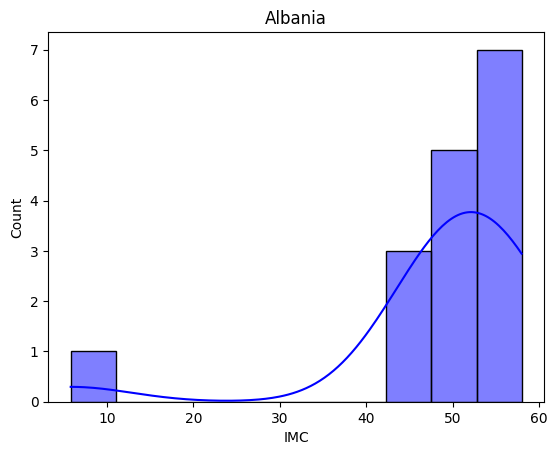

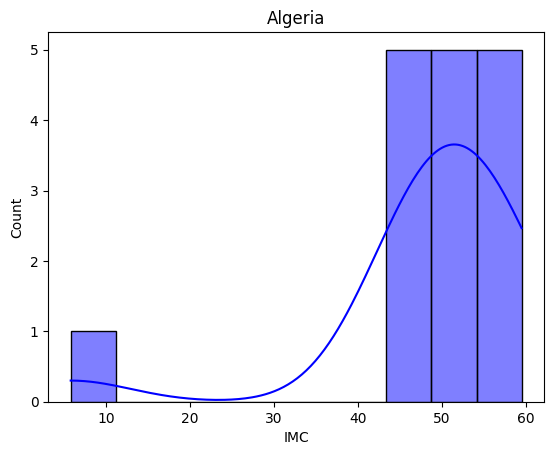

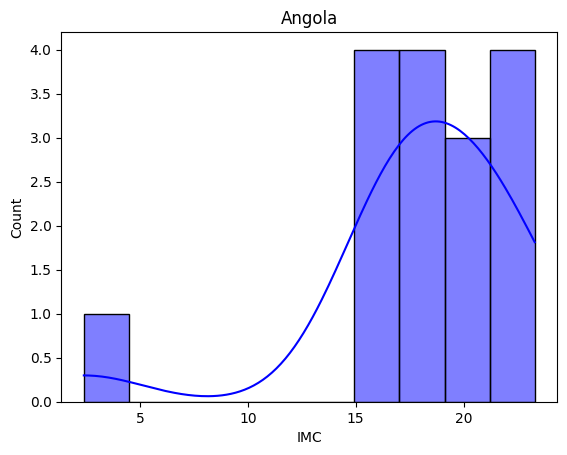

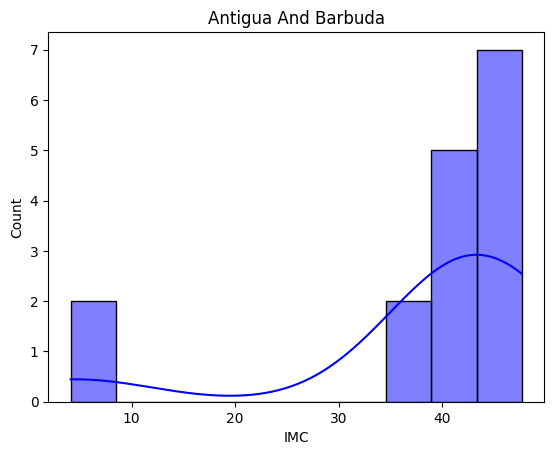

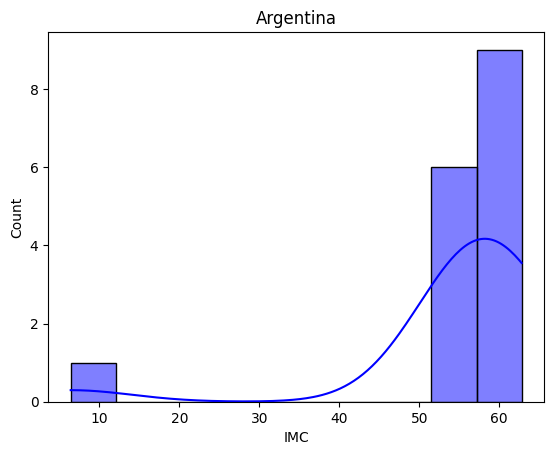

...

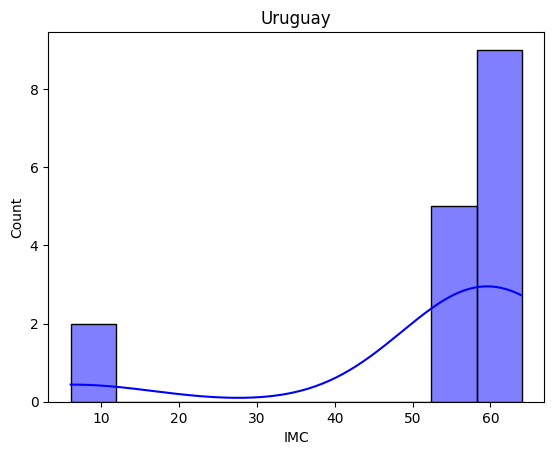

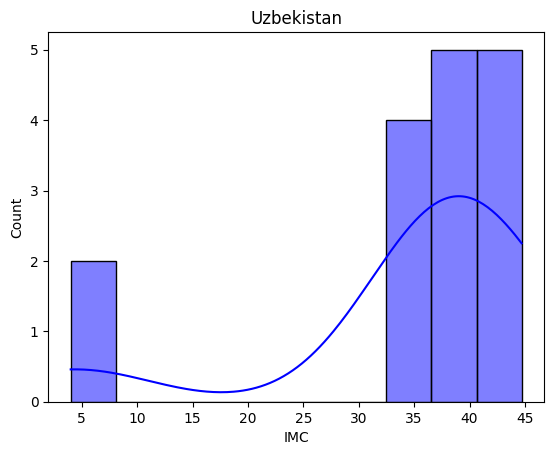

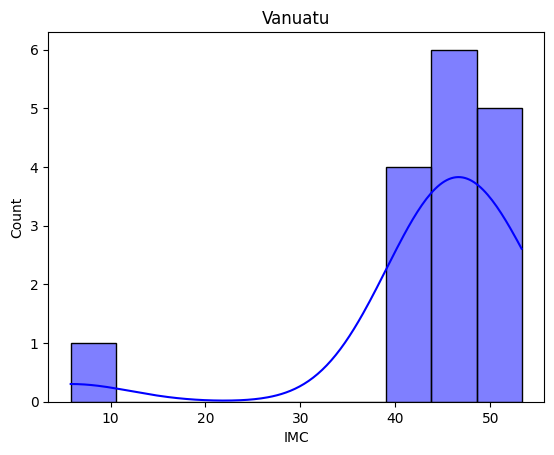

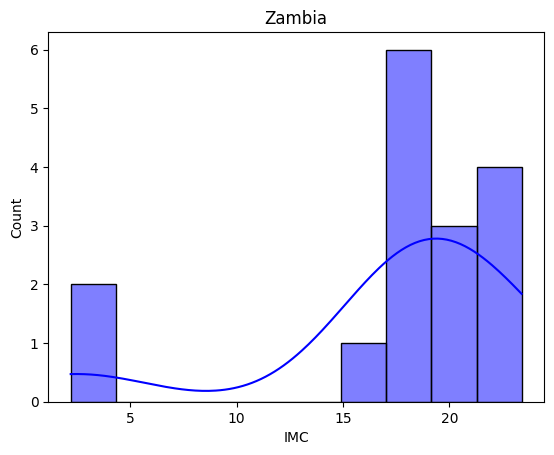

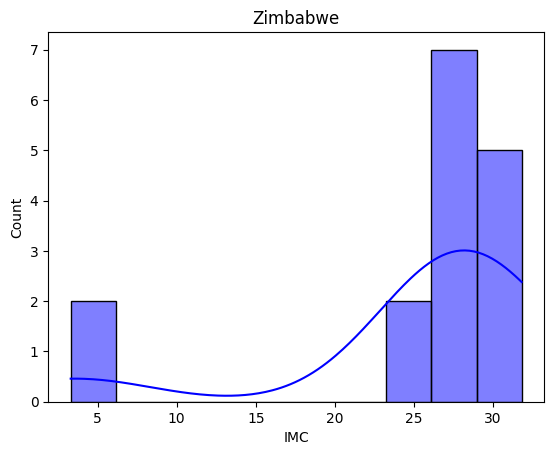

In [60]:
for pais in outliers_IMC.pais.unique():
    sns.histplot(data=df_filtrado6[df_filtrado6['pais'] == pais], x='IMC', kde=True, bins=10, color='blue')
    plt.title(f'{pais}')
    plt.show()

In [61]:
df_cleaned5 = df_cleaned4.groupby('pais').apply(substituir_outliers_por_mediana, 'IMC')
df_cleaned5.reset_index(drop=True, inplace=True)

___
## mortalidade_5anos
___

In [62]:
# Aplicar a função em cada grupo de país
outliers_mortalidade_5anos = df_filtrado6.groupby('pais').apply(identificar_outliers, 'mortalidade_5anos')

outliers_mortalidade_5anos.reset_index(drop=True, inplace=True)
outliers_mortalidade_5anos.pais.value_counts()
outliers_mortalidade_5anos.pais.value_counts()

pais
Pakistan        5
Mongolia        5
Uruguay         4
Chile           3
Namibia         3
Turkmenistan    3
Malaysia        2
Belarus         2
Djibouti        2
Spain           2
Albania         1
Bhutan          1
Mauritania      1
Haiti           1
Serbia          1
Sri Lanka       1
Name: count, dtype: int64

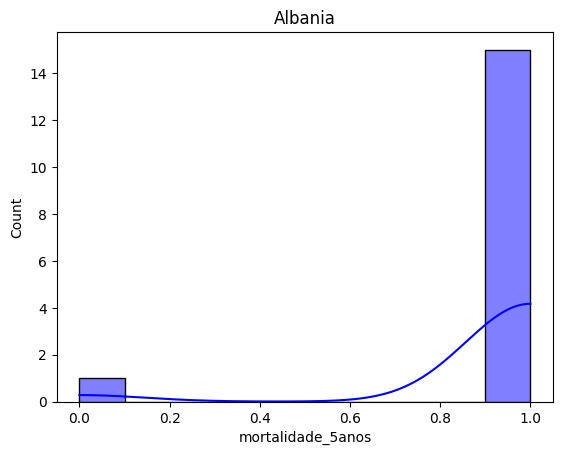

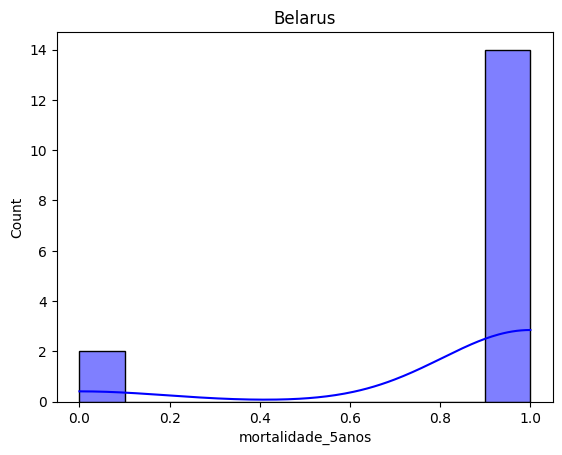

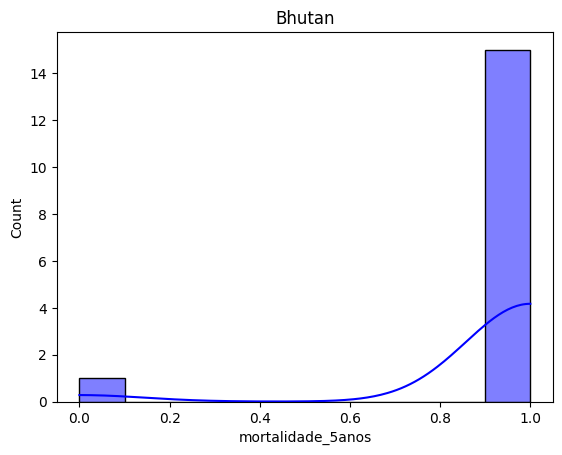

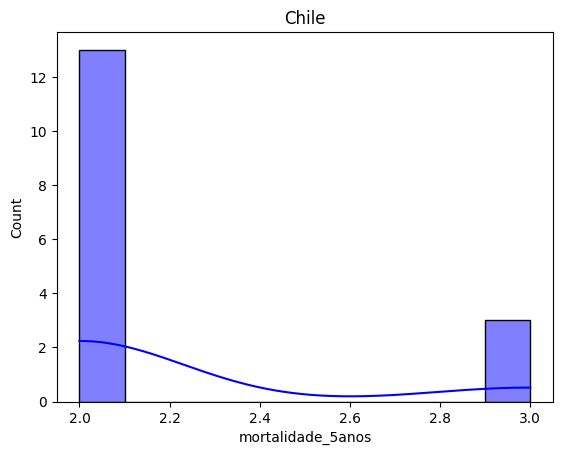

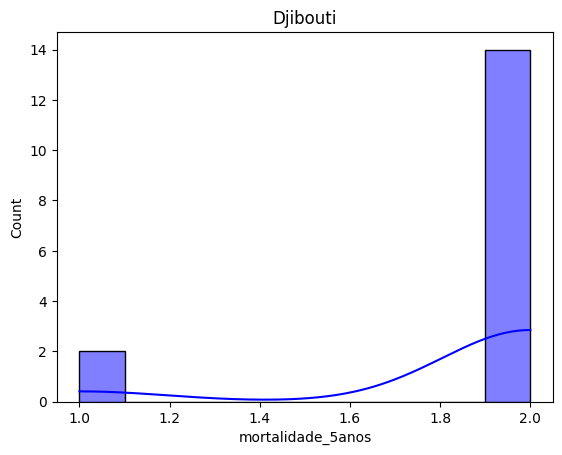

...

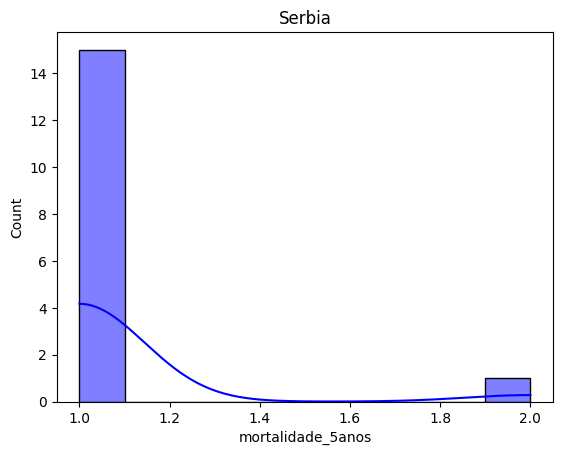

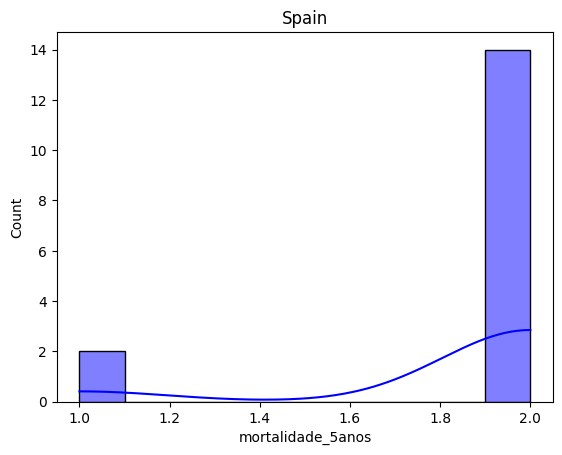

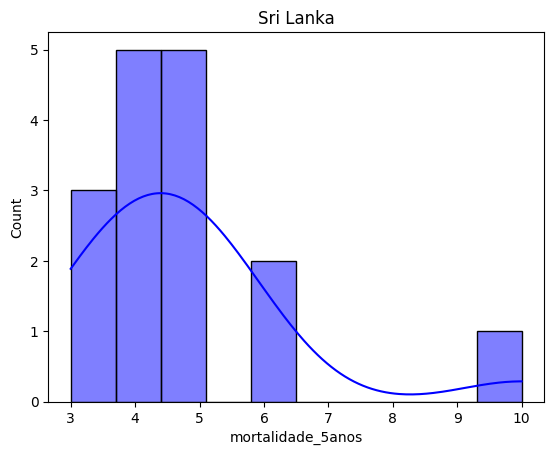

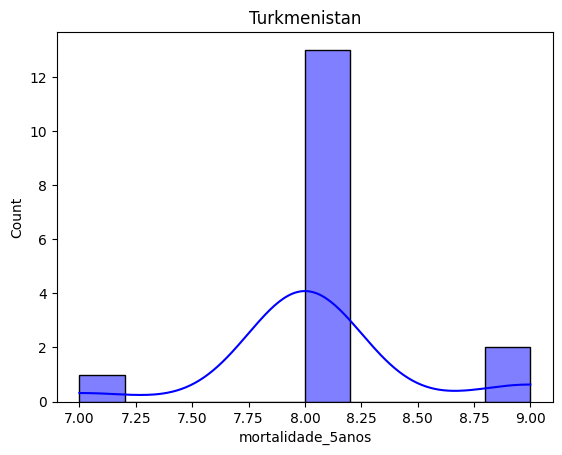

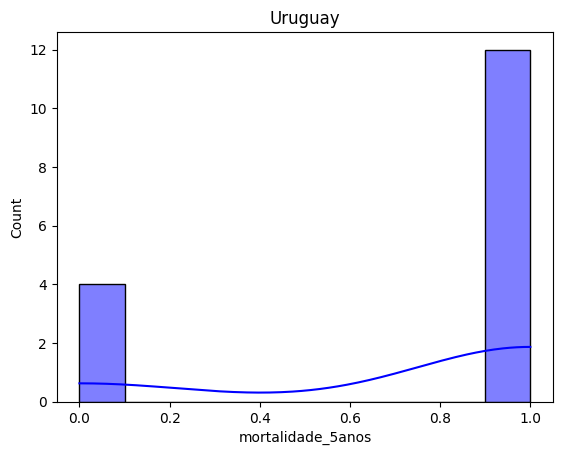

In [63]:
for pais in outliers_mortalidade_5anos.pais.unique():
    sns.histplot(data=df_filtrado6[df_filtrado6['pais'] == pais], x='mortalidade_5anos', kde=True, bins=10, color='blue')
    plt.title(f'{pais}')
    plt.show()

___
## vacina_poliomelite_crianca
___

In [64]:
# Aplicar a função em cada grupo de país
outliers_vacina_poliomelite_crianca = df_filtrado6.groupby('pais').apply(identificar_outliers, 'vacina_poliomelite_crianca')

outliers_vacina_poliomelite_crianca.reset_index(drop=True, inplace=True)
outliers_vacina_poliomelite_crianca.pais.value_counts()
outliers_vacina_poliomelite_crianca.pais.value_counts()

pais
Netherlands        6
Lebanon            6
Indonesia          4
Lesotho            4
Australia          4
                  ..
Solomon Islands    1
Timor-Leste        1
Tunisia            1
Uganda             1
Zimbabwe           1
Name: count, Length: 102, dtype: int64

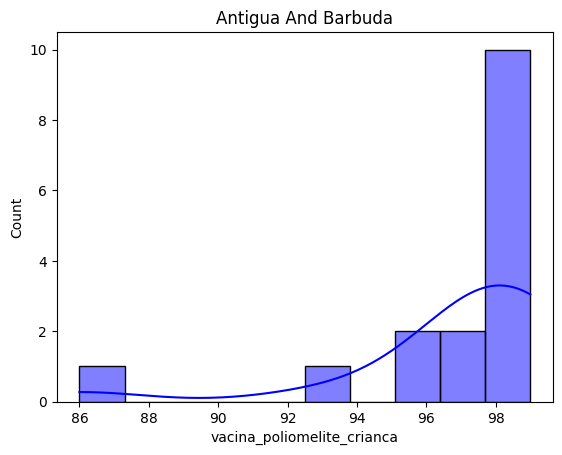

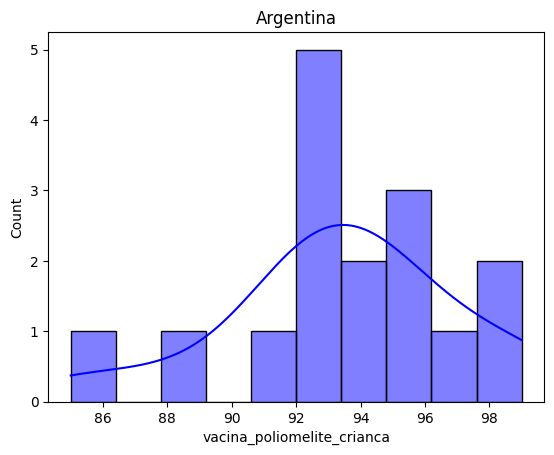

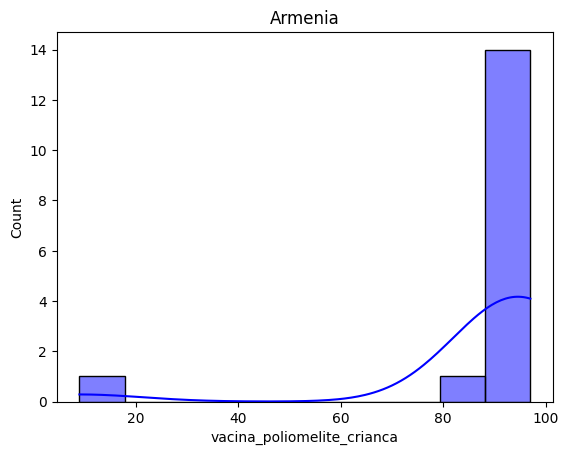

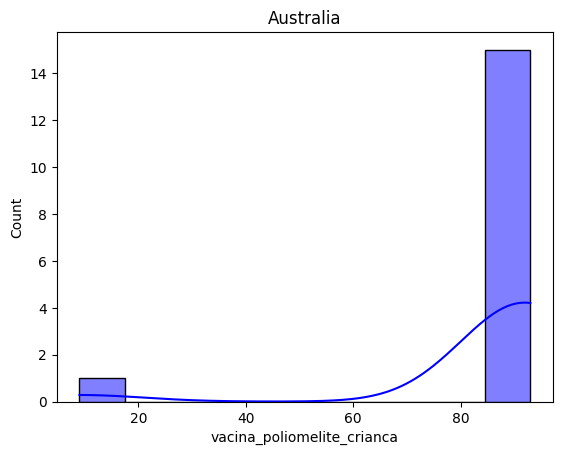

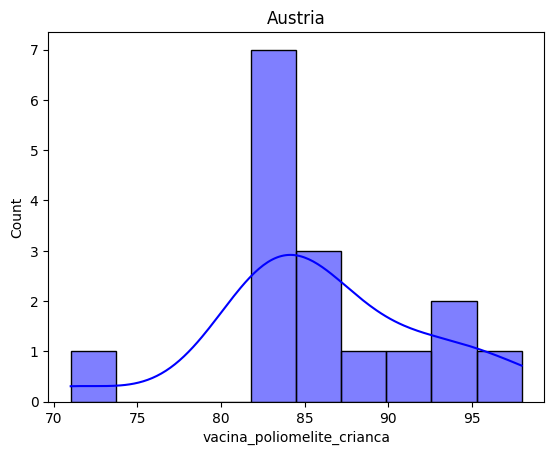

...

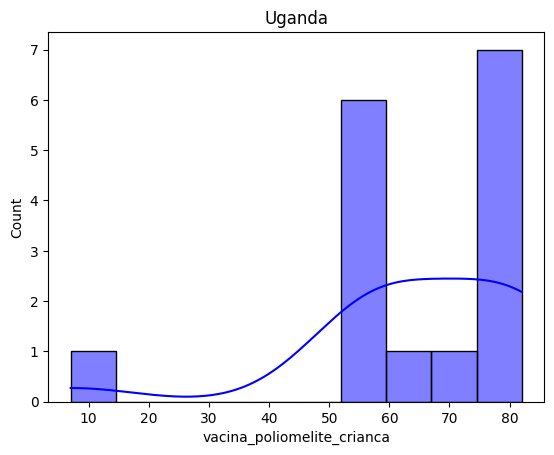

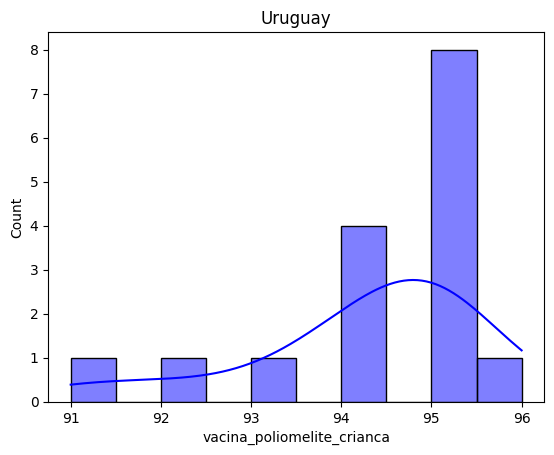

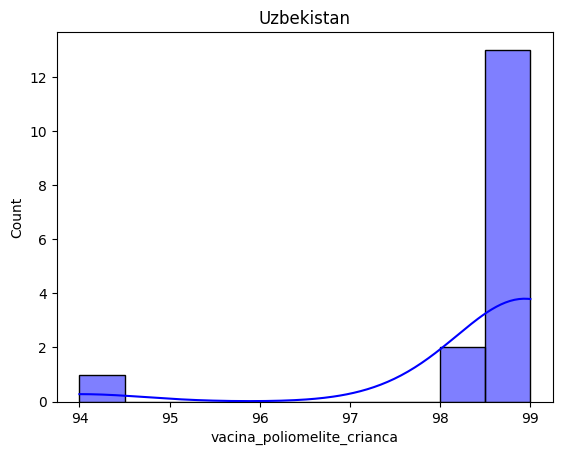

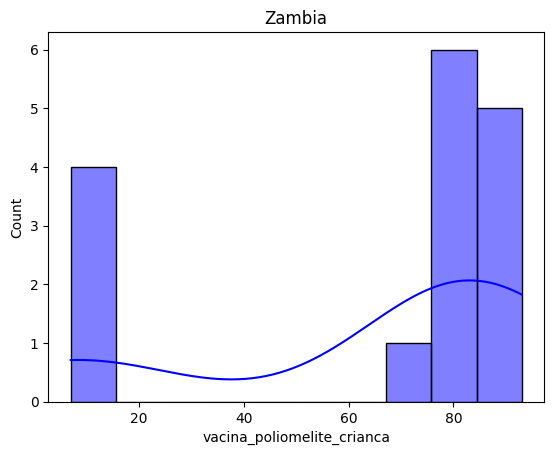

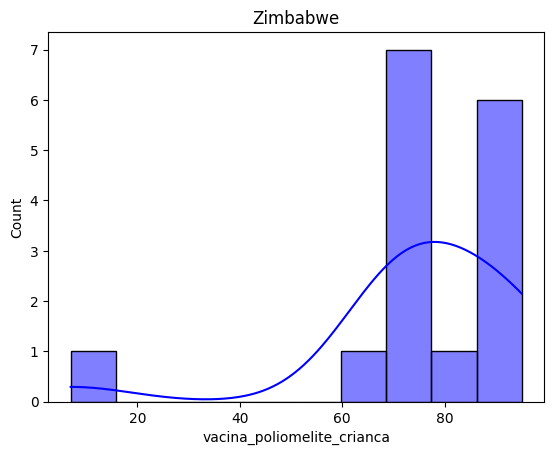

In [65]:
for pais in outliers_vacina_poliomelite_crianca.pais.unique():
    sns.histplot(data=df_filtrado6[df_filtrado6['pais'] == pais], x='vacina_poliomelite_crianca', kde=True, bins=10, color='blue')
    plt.title(f'{pais}')
    plt.show()

In [66]:
df_cleaned6 = df_cleaned5.groupby('pais').apply(substituir_outliers_por_mediana, 'vacina_poliomelite_crianca')
df_cleaned6.reset_index(drop=True, inplace=True)

___
## vacina_difteria_crianca
___

In [67]:
# Aplicar a função em cada grupo de país
outliers_vacina_difteria_crianca = df_filtrado6.groupby('pais').apply(identificar_outliers, 'vacina_difteria_crianca')

outliers_vacina_difteria_crianca.reset_index(drop=True, inplace=True)
outliers_vacina_difteria_crianca.pais.value_counts()
outliers_vacina_difteria_crianca.pais.value_counts()

pais
Netherlands     6
Australia       4
Poland          4
New Zealand     4
Oman            4
               ..
Swaziland       1
South Africa    1
Turkmenistan    1
Uganda          1
Zimbabwe        1
Name: count, Length: 92, dtype: int64

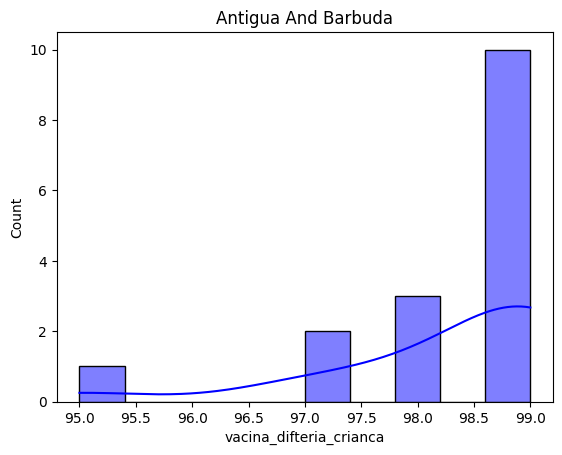

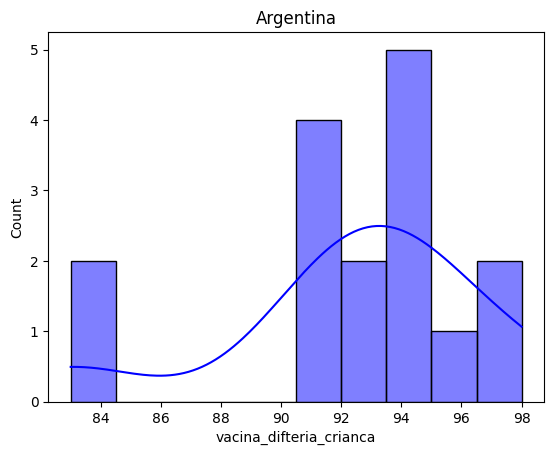

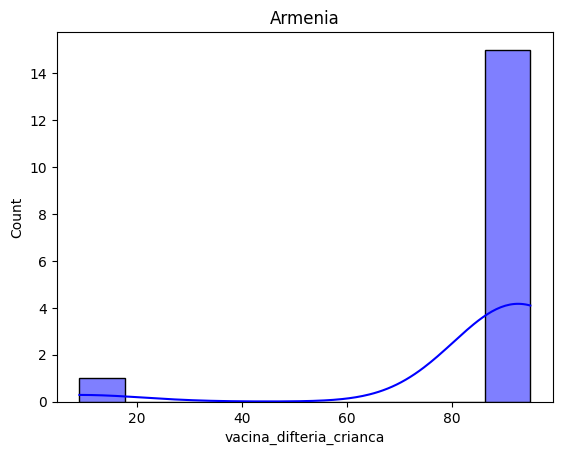

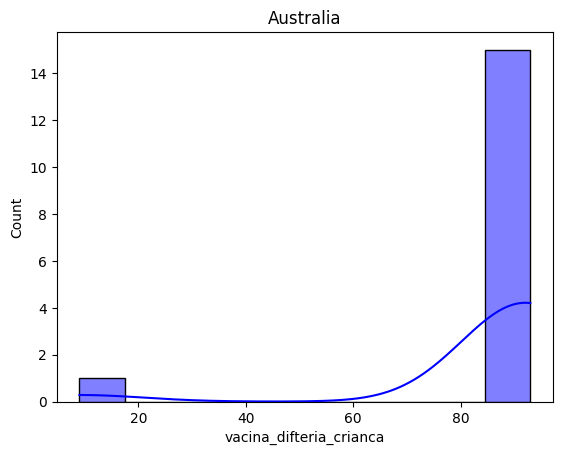

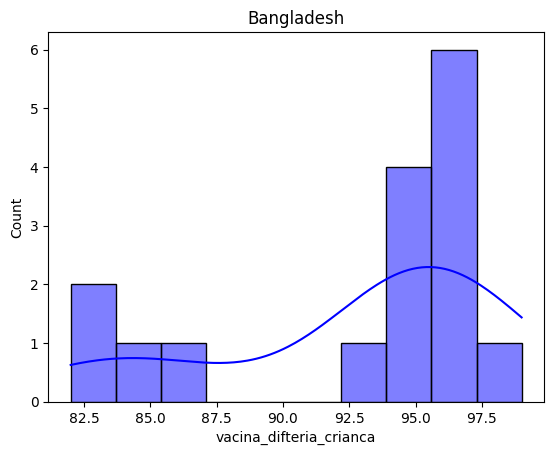

...

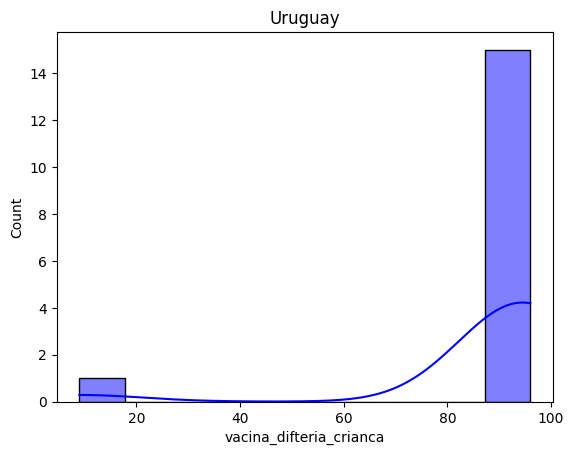

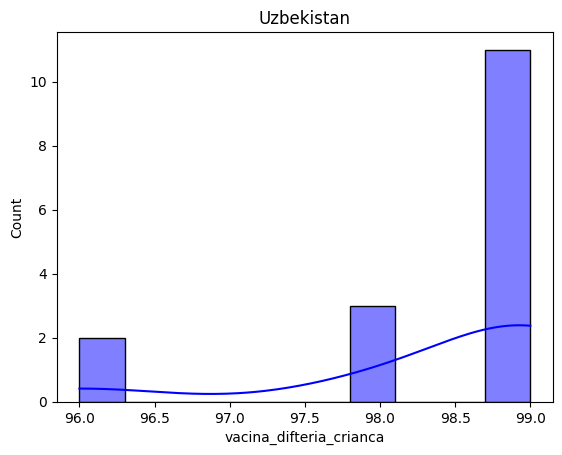

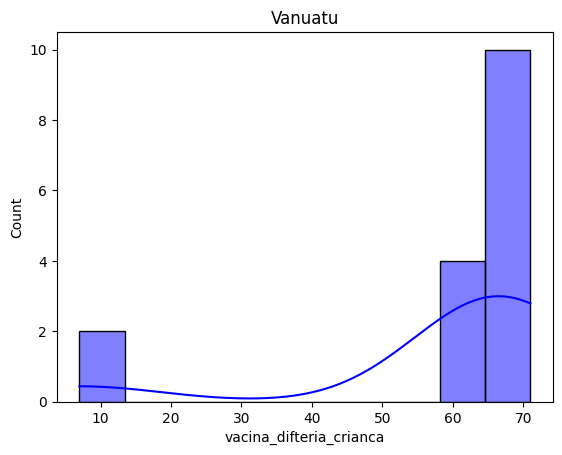

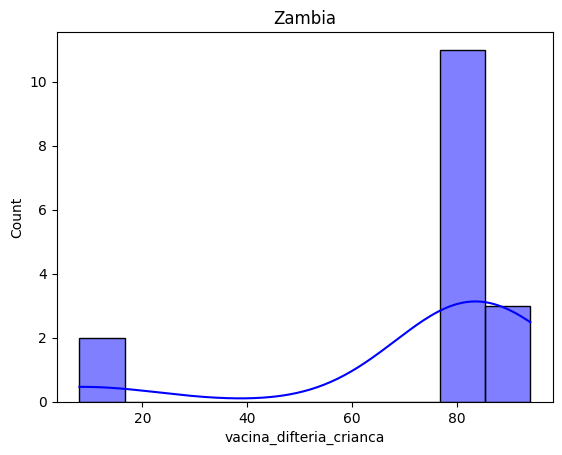

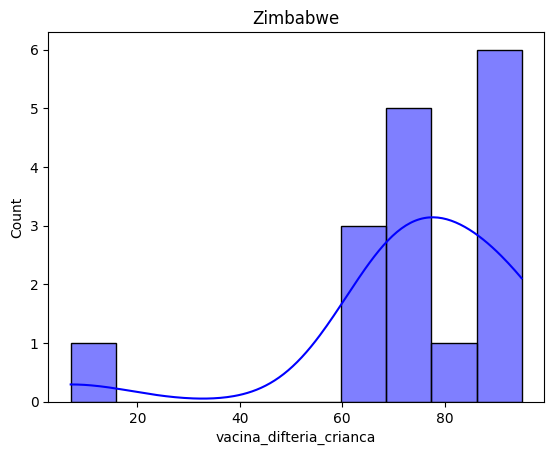

In [68]:
for pais in outliers_vacina_difteria_crianca.pais.unique():
    sns.histplot(data=df_filtrado6[df_filtrado6['pais'] == pais], x='vacina_difteria_crianca', kde=True, bins=10, color='blue')
    plt.title(f'{pais}')
    plt.show()

In [69]:
df_cleaned7 = df_cleaned6.groupby('pais').apply(substituir_outliers_por_mediana, 'vacina_difteria_crianca')
df_cleaned7.reset_index(drop=True, inplace=True)

___
## pct_despesa_saude
___

In [70]:
# Aplicar a função em cada grupo de país
outliers_pct_despesa_saude = df_filtrado6.groupby('pais').apply(identificar_outliers, 'pct_despesa_saude')

outliers_pct_despesa_saude.reset_index(drop=True, inplace=True)
outliers_pct_despesa_saude.pais.value_counts()

pais
Ecuador        4
Uruguay        4
Lebanon        3
Portugal       3
Romania        3
Lesotho        2
Togo           2
Paraguay       2
Georgia        2
Zimbabwe       2
Cambodia       2
Haiti          1
Israel         1
Greece         1
Guatemala      1
Benin          1
Djibouti       1
Malta          1
Lithuania      1
Poland         1
New Zealand    1
Morocco        1
Mexico         1
Madagascar     1
Rwanda         1
Singapore      1
Vanuatu        1
Name: count, dtype: int64

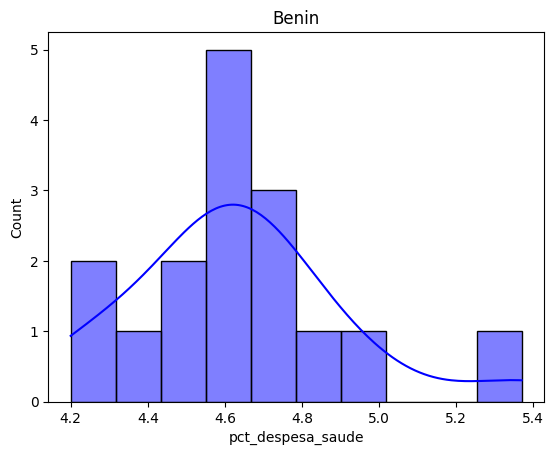

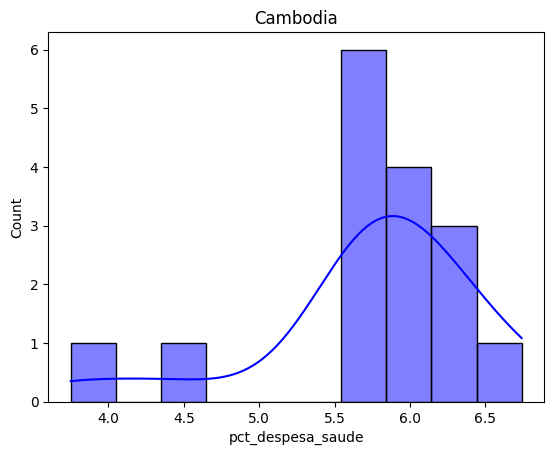

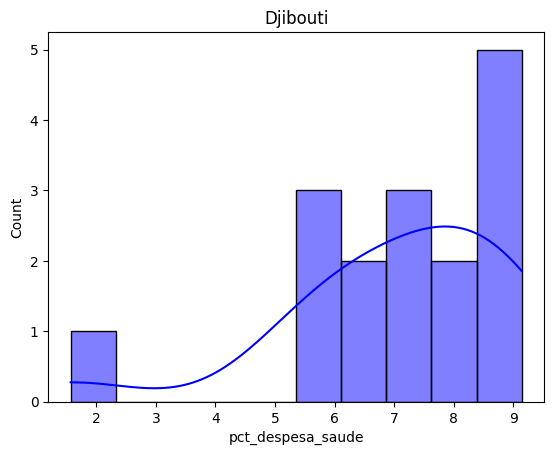

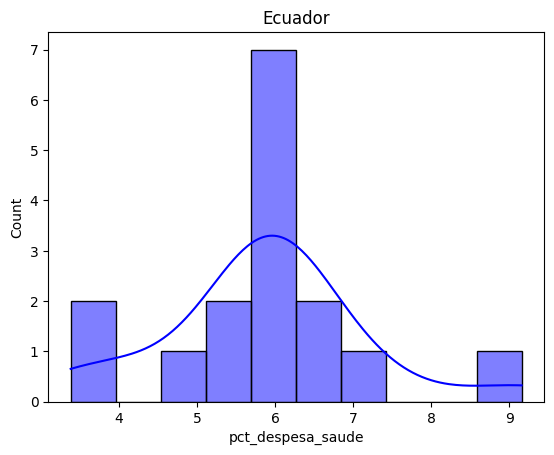

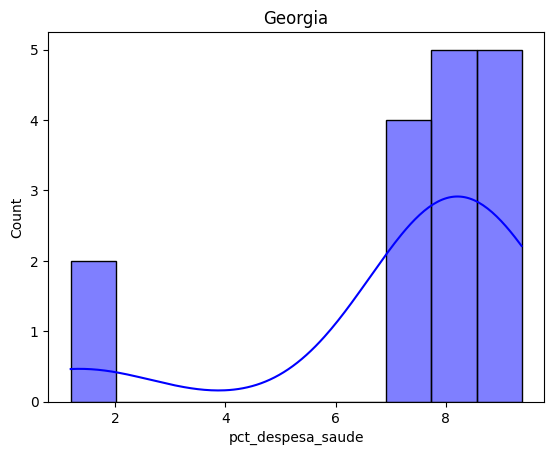

...

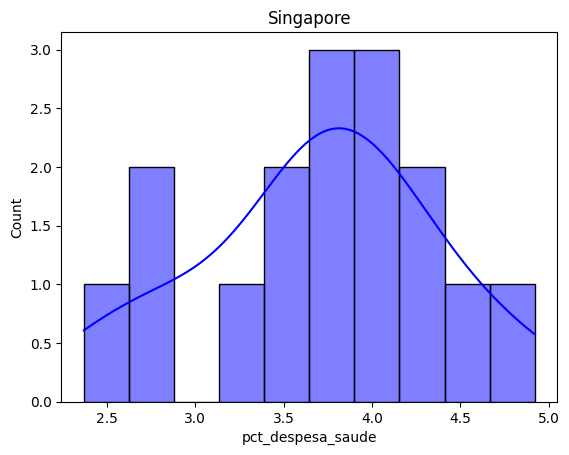

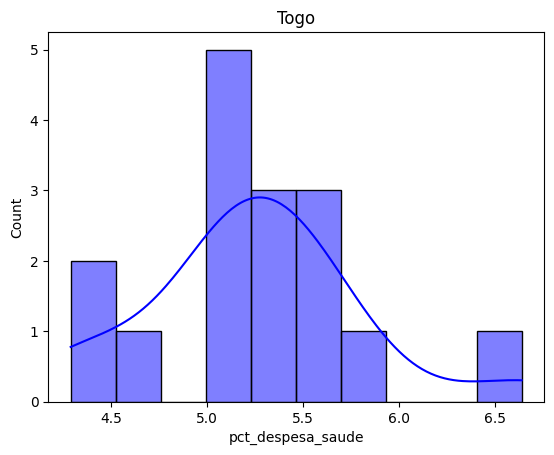

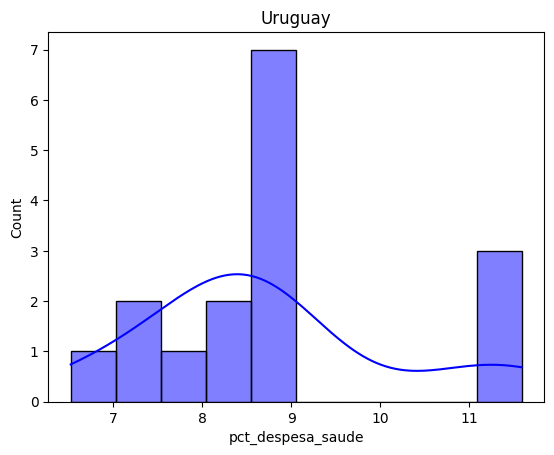

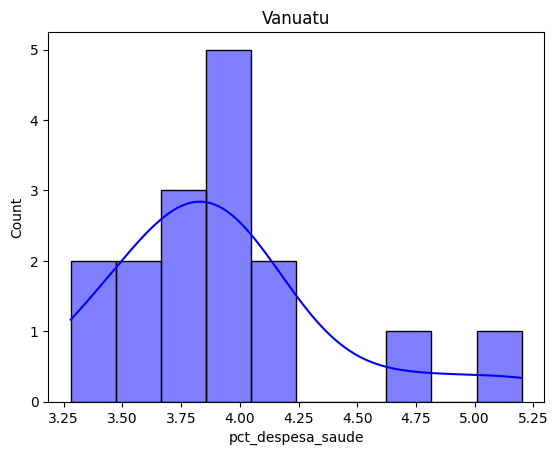

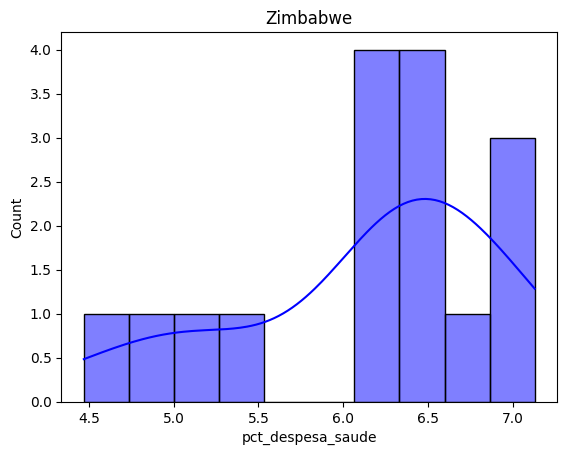

In [71]:
for pais in outliers_pct_despesa_saude.pais.unique():
    sns.histplot(data=df_filtrado6[df_filtrado6['pais'] == pais], x='pct_despesa_saude', kde=True, bins=10, color='blue')
    plt.title(f'{pais}')
    plt.show()

In [72]:
df_cleaned8 = df_cleaned7.groupby('pais').apply(substituir_outliers_por_mediana, 'pct_despesa_saude')
df_cleaned8.reset_index(drop=True, inplace=True)

___
## morte_HIV_4anos
___

In [73]:
# Aplicar a função em cada grupo de país
outliers_morte_HIV_4anos = df_filtrado6.groupby('pais').apply(identificar_outliers, 'morte_HIV_4anos')

outliers_morte_HIV_4anos.reset_index(drop=True, inplace=True)
outliers_morte_HIV_4anos.pais.value_counts()

pais
Guatemala     3
Barbados      2
Guinea        2
Mauritania    2
Mauritius     1
Name: count, dtype: int64

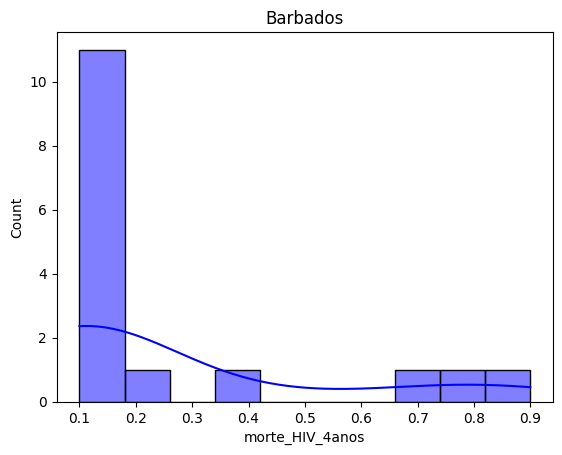

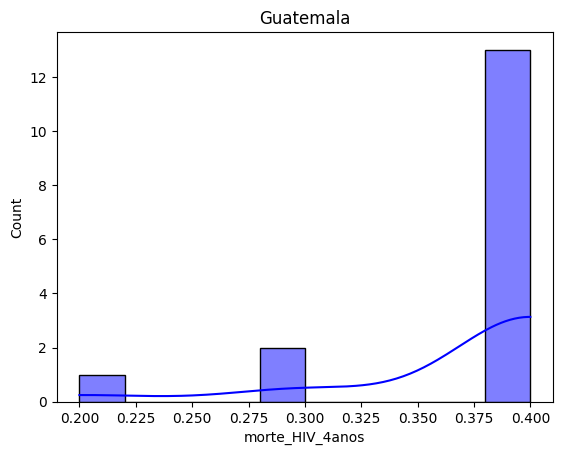

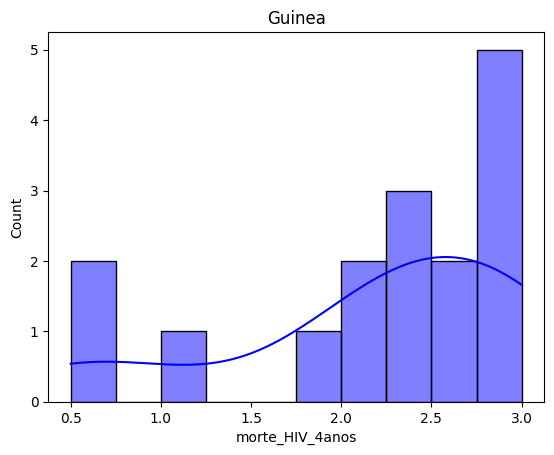

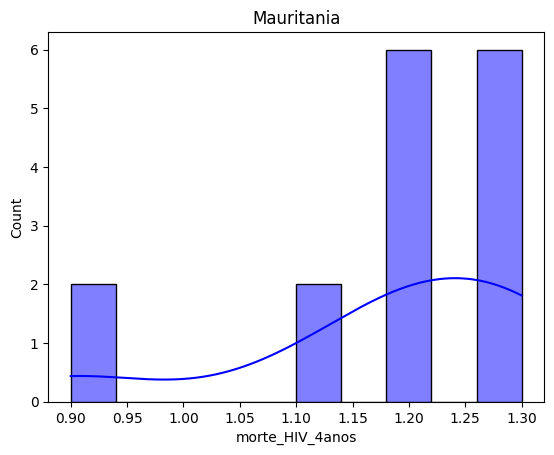

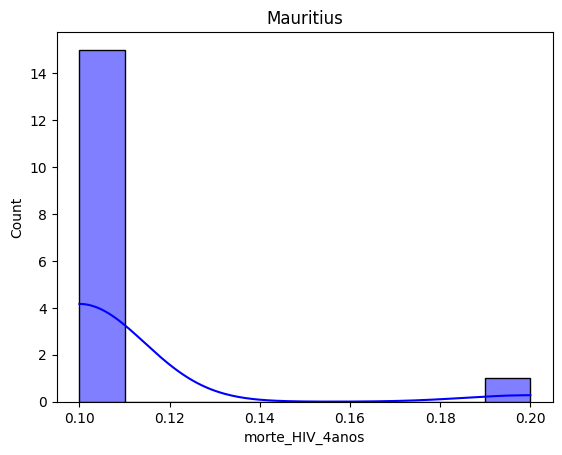

In [74]:
for pais in outliers_morte_HIV_4anos.pais.unique():
    sns.histplot(data=df_filtrado6[df_filtrado6['pais'] == pais], x='morte_HIV_4anos', kde=True, bins=10, color='blue')
    plt.title(f'{pais}')
    plt.show()

In [75]:
df_cleaned9 = df_cleaned8.groupby('pais').apply(substituir_outliers_por_mediana, 'morte_HIV_4anos')
df_cleaned9.reset_index(drop=True, inplace=True)

In [76]:
df_cleaned9[df_cleaned9["pais"] == "Barbados"]

,pais,ano,status,expectativa_vida,mortalidade_adulta,mortes_infanis,consumo_alcool,pct_despesa_saude_pib,vacina_hep_b_crianca,relato_sarampo,IMC,mortalidade_5anos,vacina_poliomelite_crianca,pct_despesa_saude,vacina_difteria_crianca,morte_HIV_4anos,PIB,populacao,magreza_10_19,magreza_5_9,composicao_recursos_renda,escolaridade
192,Barbados,2015,Developing,75.5,98.0,0,8.206667,0.000000,97.000000,0.0,54.50,0,97.0,6.122,97.0,0.1,15557.83810,278083.0,3.8,3.7,0.794,15.3
193,Barbados,2014,Developing,75.4,1.0,0,8.820000,294.905658,94.000000,0.0,53.70,0,95.0,5.960,94.0,0.1,15359.66971,277493.0,3.8,3.7,0.793,15.3
194,Barbados,2013,Developing,75.2,11.0,0,8.740000,263.037284,91.000000,0.0,53.00,0,91.0,5.960,91.0,0.1,15472.78140,276865.0,3.8,3.8,0.792,15.3
195,Barbados,2012,Developing,75.1,12.0,0,8.610000,260.004386,87.000000,0.0,52.20,0,88.0,5.960,87.0,0.1,15384.87490,276197.0,3.8,3.8,0.785,15.3
196,Barbados,2011,Developing,74.9,14.0,0,8.510000,173.982563,91.000000,0.0,51.40,0,91.0,6.670,91.0,0.1,15534.15740,275486.0,3.8,3.8,0.780,15.5
197,Barbados,2010,Developing,74.7,16.0,0,8.410000,154.963086,86.000000,0.0,48.05,0,91.0,6.170,86.0,0.1,1595.91232,274711.0,3.8,3.8,0.781,15.8
198,Barbados,2009,Developing,74.6,19.0,0,8.460000,327.161813,93.000000,0.0,49.90,0,93.0,6.210,93.0,0.1,16523.32388,273791.0,3.8,3.8,0.779,15.5
199,Barbados,2008,Developing,74.4,111.0,0,8.950000,25.522771,85.000000,0.0,49.20,0,85.0,6.100,85.0,0.1,1657.32280,272635.0,3.9,3.9,0.775,15.3
200,Barbados,2007,Developing,74.2,113.0,0,8.470000,177.741324,93.000000,0.0,48.40,0,93.0,5.640,93.0,0.1,16462.48556,271444.0,3.9,3.9,0.771,15.0
201,Barbados,2006,Developing,74.1,115.0,0,8.390000,181.500086,84.000000,0.0,47.70,0,85.0,5.270,84.0,0.1,15646.55910,270425.0,4.0,3.9,0.766,14.8


___
## populacao
___

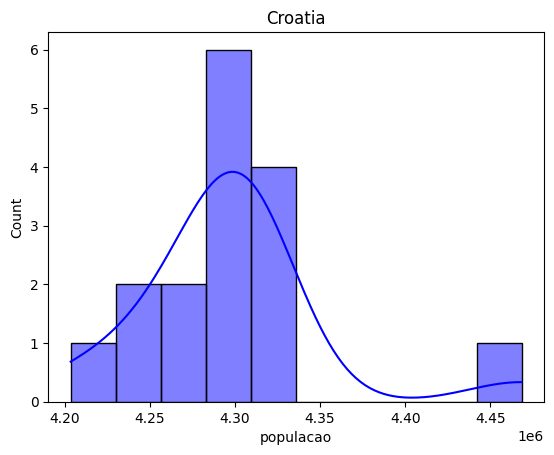

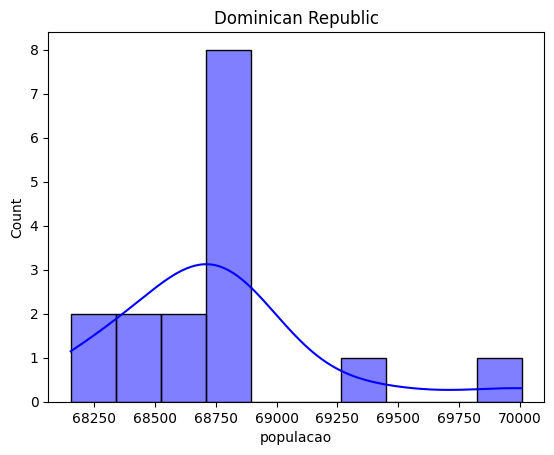

In [77]:
# Aplicar a função em cada grupo de país
outliers_populacao = df_filtrado6.groupby('pais').apply(identificar_outliers, 'populacao')

outliers_populacao.reset_index(drop=True, inplace=True)
outliers_populacao.pais.value_counts()

for pais in outliers_populacao.pais.unique():
    sns.histplot(data=df_filtrado6[df_filtrado6['pais'] == pais], x='populacao', kde=True, bins=10, color='blue')
    plt.title(f'{pais}')
    plt.show()

In [78]:
df_cleaned10 = df_cleaned9.groupby('pais').apply(substituir_outliers_por_mediana, 'populacao')
df_cleaned10.reset_index(drop=True, inplace=True)

___
## magreza_10_19
___

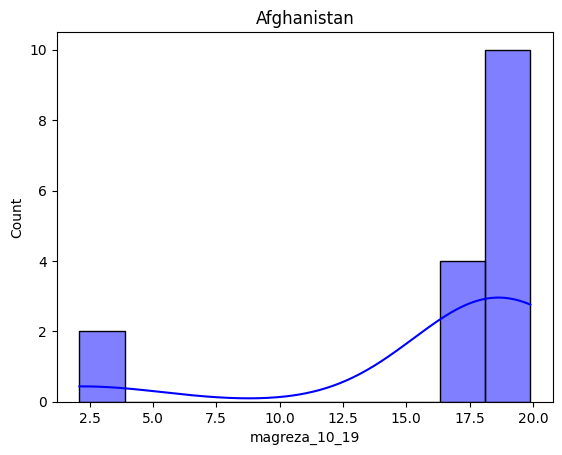

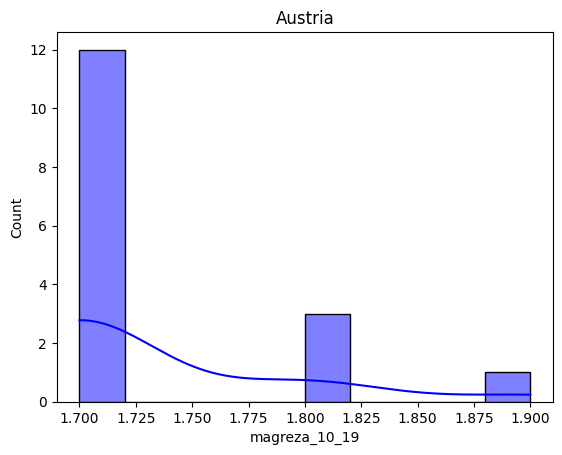

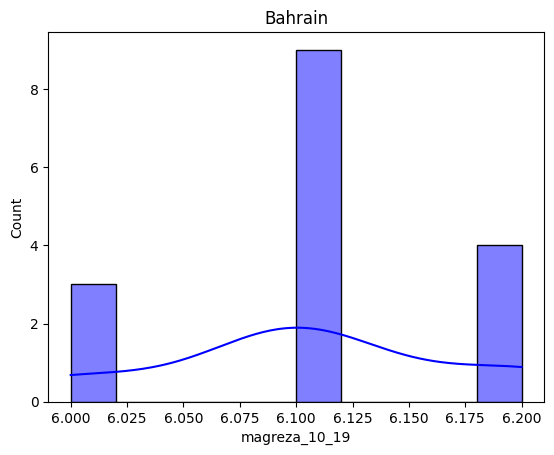

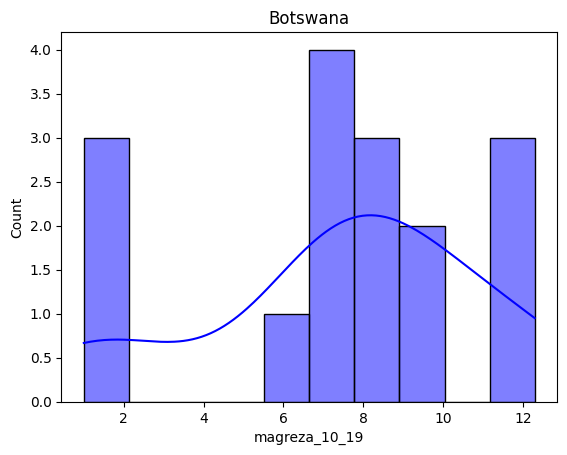

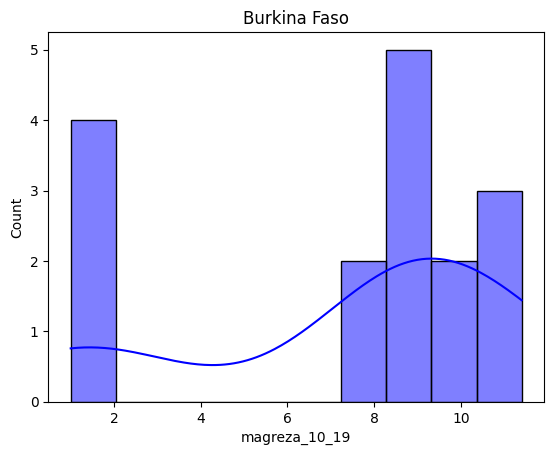

...

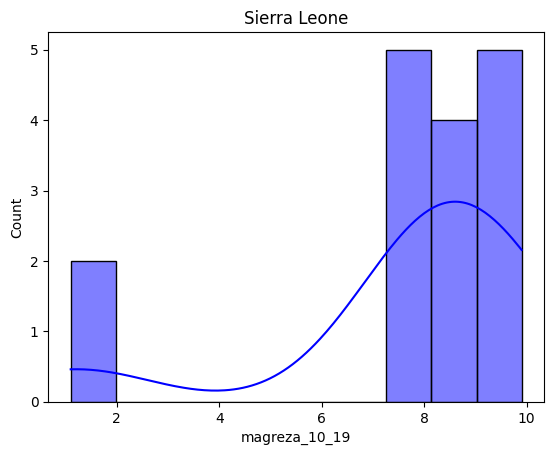

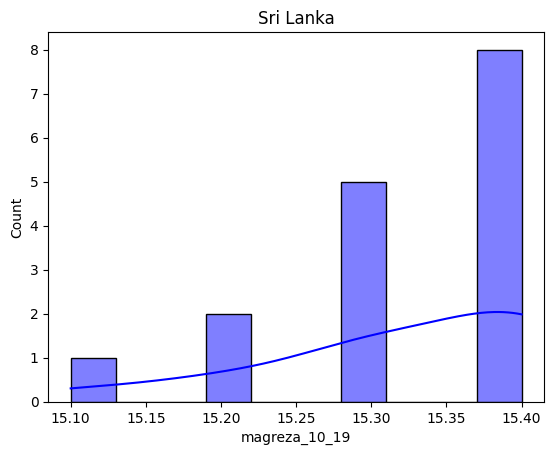

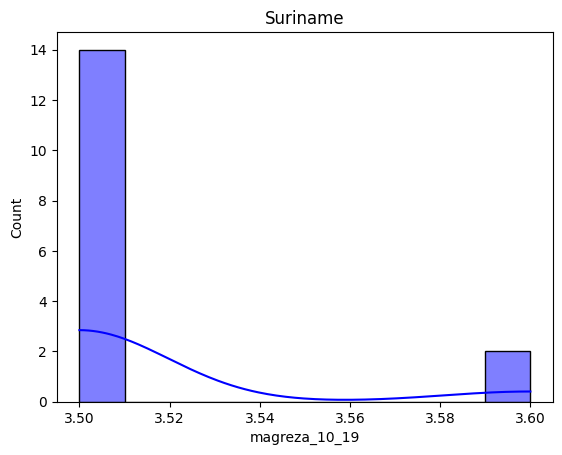

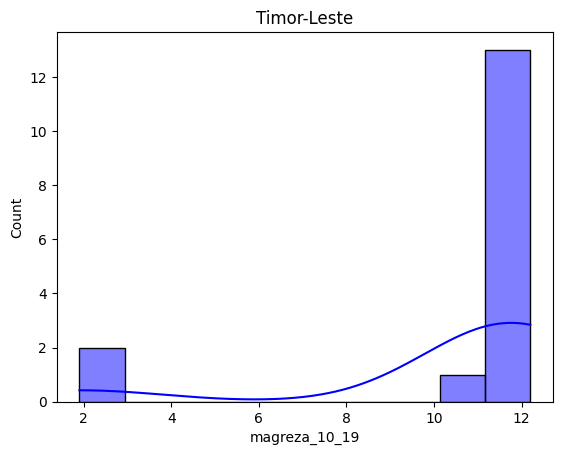

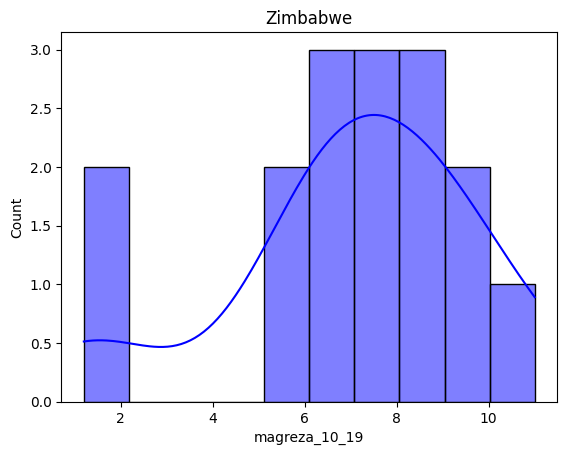

In [79]:
# Aplicar a função em cada grupo de país
outliers_magreza_10_19 = df_filtrado6.groupby('pais').apply(identificar_outliers, 'magreza_10_19')

outliers_magreza_10_19.reset_index(drop=True, inplace=True)
outliers_magreza_10_19.pais.value_counts()

for pais in outliers_magreza_10_19.pais.unique():
    sns.histplot(data=df_filtrado6[df_filtrado6['pais'] == pais], x='magreza_10_19', kde=True, bins=10, color='blue')
    plt.title(f'{pais}')
    plt.show()

In [80]:
df_cleaned11 = df_cleaned10.groupby('pais').apply(substituir_outliers_por_mediana, 'magreza_10_19')
df_cleaned11.reset_index(drop=True, inplace=True)

___
## composicao_recursos_renda
___

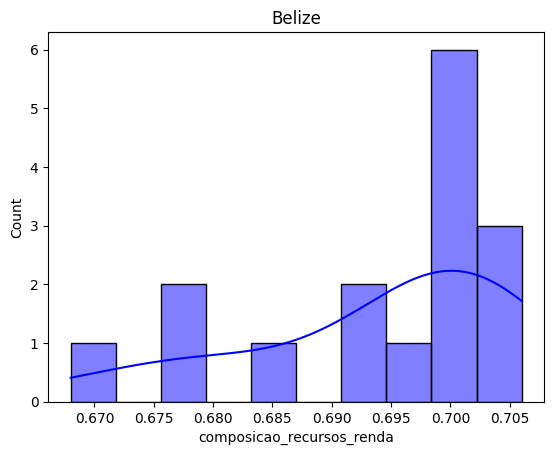

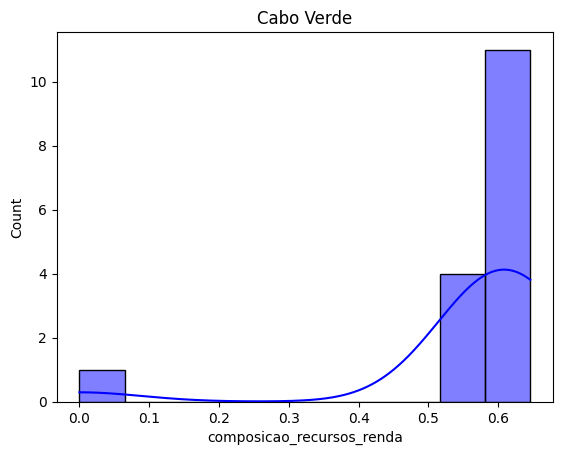

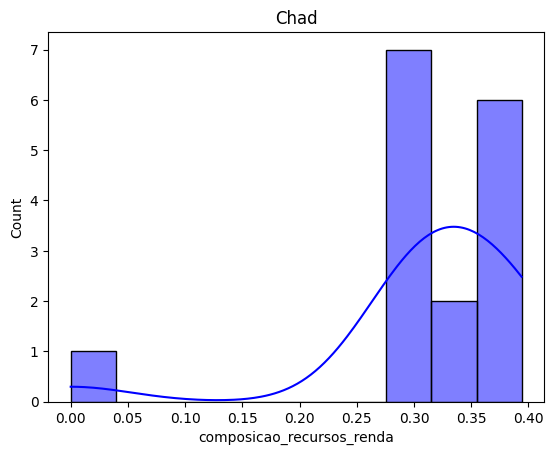

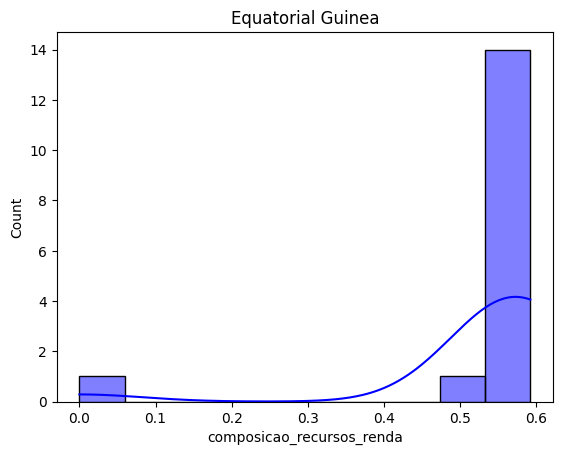

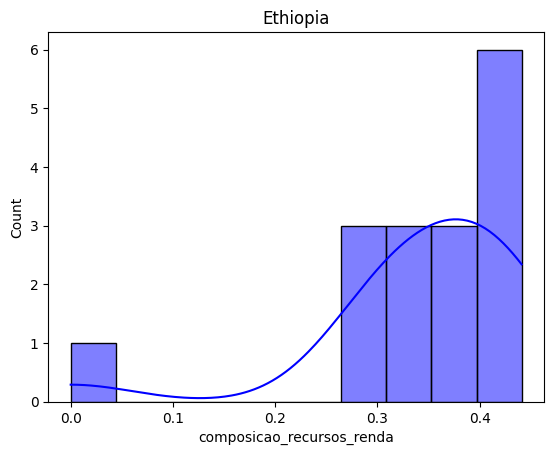

...

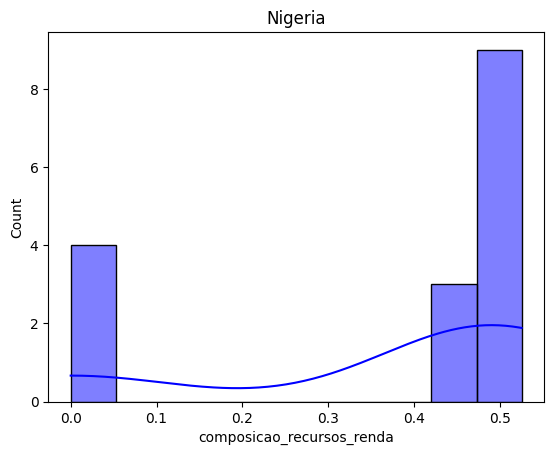

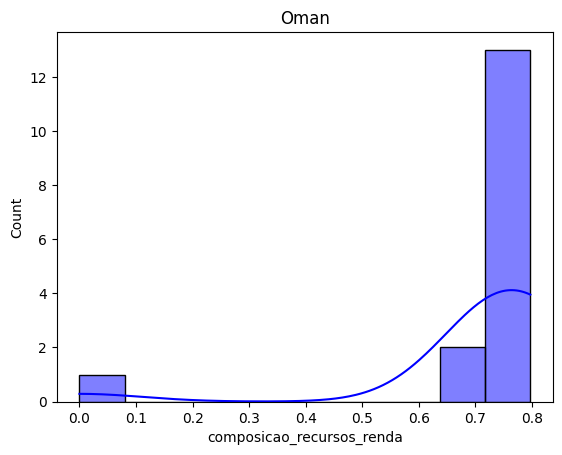

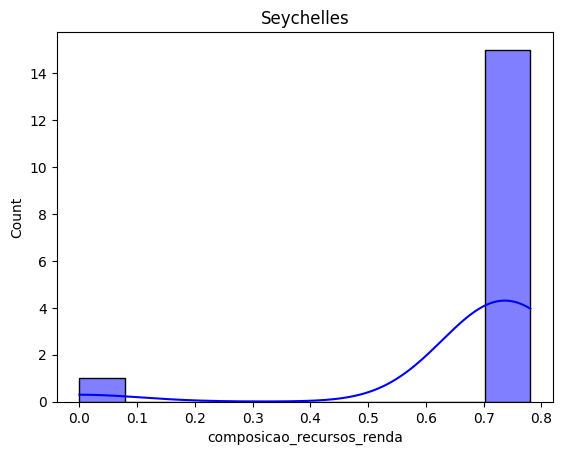

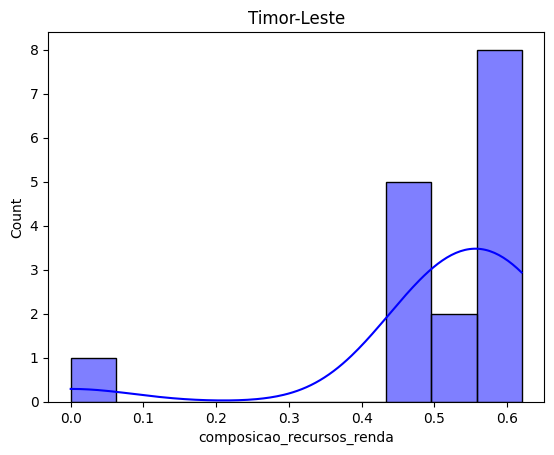

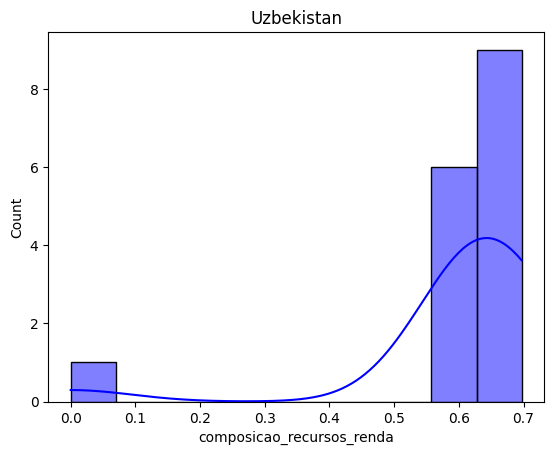

In [81]:
# Aplicar a função em cada grupo de país
outliers_composicao_recursos_renda = df_filtrado6.groupby('pais').apply(identificar_outliers, 'composicao_recursos_renda')

outliers_composicao_recursos_renda.reset_index(drop=True, inplace=True)
outliers_composicao_recursos_renda.pais.value_counts()

for pais in outliers_composicao_recursos_renda.pais.unique():
    sns.histplot(data=df_filtrado6[df_filtrado6['pais'] == pais], x='composicao_recursos_renda', kde=True, bins=10, color='blue')
    plt.title(f'{pais}')
    plt.show()

In [82]:
df_cleaned12 = df_cleaned11.groupby('pais').apply(substituir_outliers_por_mediana, 'composicao_recursos_renda')
df_cleaned12.reset_index(drop=True, inplace=True)

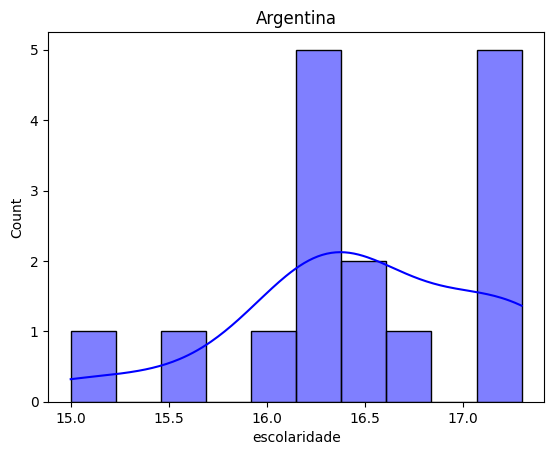

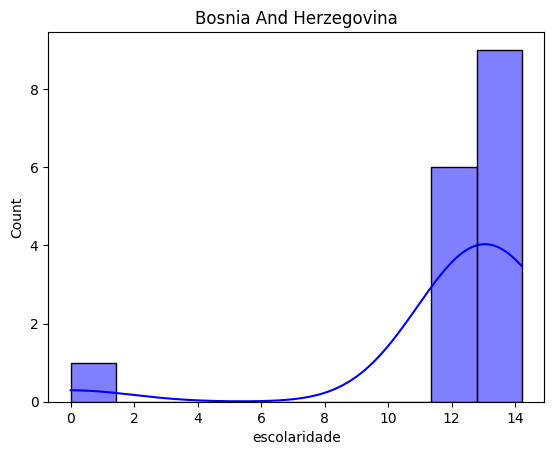

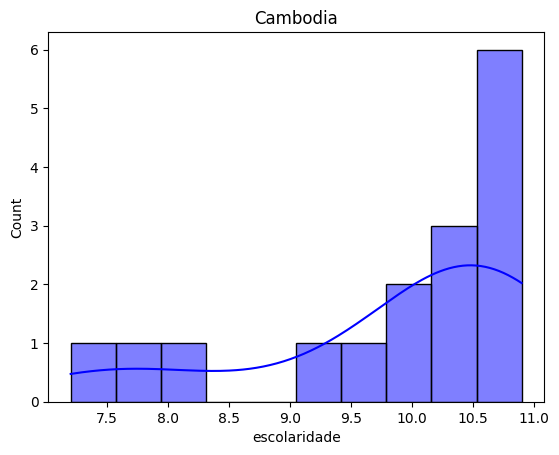

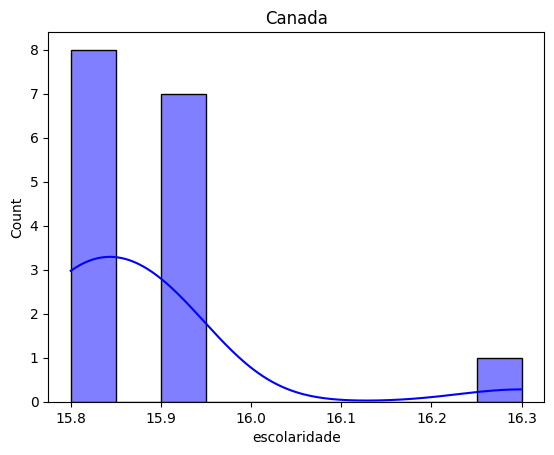

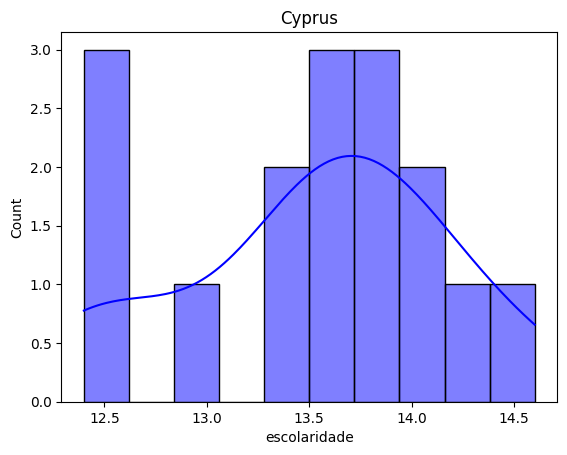

...

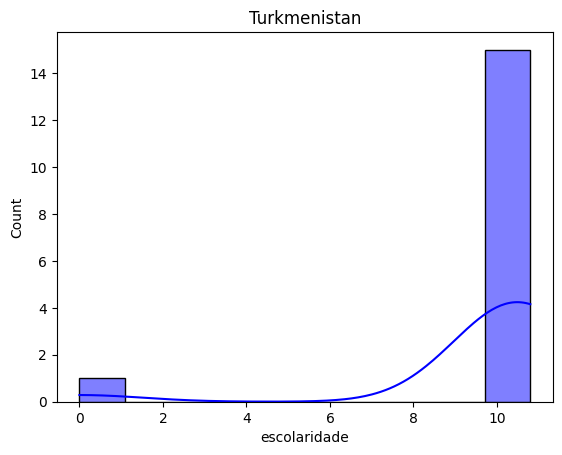

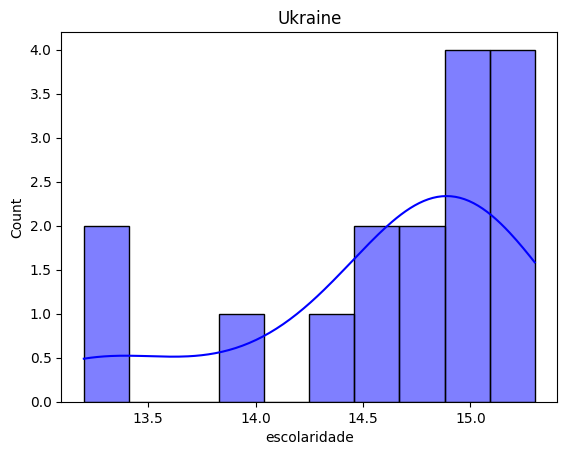

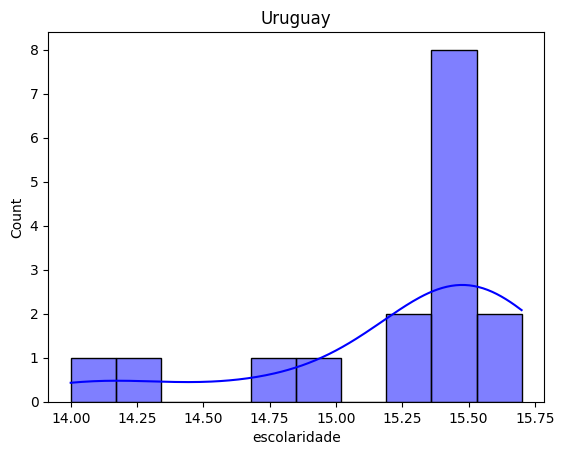

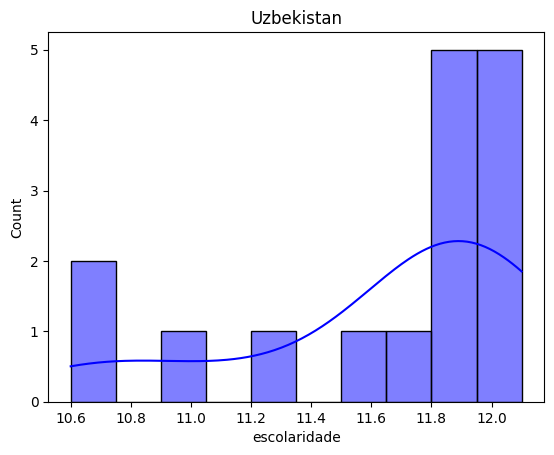

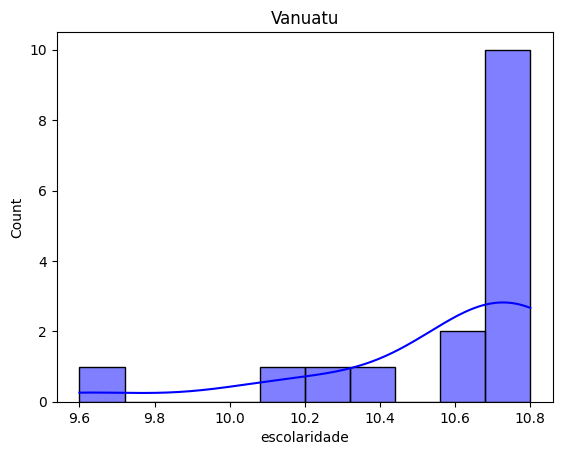

In [83]:
# Aplicar a função em cada grupo de país
outliers_escolaridade = df_filtrado6.groupby('pais').apply(identificar_outliers, 'escolaridade')

outliers_escolaridade.reset_index(drop=True, inplace=True)
outliers_escolaridade.pais.value_counts()

for pais in outliers_escolaridade.pais.unique():
    sns.histplot(data=df_filtrado6[df_filtrado6['pais'] == pais], x='escolaridade', kde=True, bins=10, color='blue')
    plt.title(f'{pais}')
    plt.show()

In [84]:
df_cleaned13 = df_cleaned12.groupby('pais').apply(substituir_outliers_por_mediana, 'escolaridade')
df_cleaned13.reset_index(drop=True, inplace=True)

In [85]:
df_cleaned13.to_csv('df_cleaned.csv', index=False)